# DM Final - Camera Settings Recognition
Amritpal Singh

### Initial Setup

#### Imports

In [207]:
import pandas as pd #standard imports
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold #preprocessing imports
from sklearn.preprocessing import MinMaxScaler
from keras.utils import to_categorical

import os #image loading and formatting imports
from PIL import Image
from PIL.ExifTags import TAGS
import cv2 

from sklearn.cluster import KMeans # model imports
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier

import tensorflow as tf #neural network imports
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, Flatten, Dropout, Dense, MaxPooling2D, BatchNormalization, AveragePooling2D, LSTM

from scipy.stats import randint, uniform #imports for randomizedsearchcv

import warnings #don't print warnings - just extra repeated output
warnings.filterwarnings("ignore")

#### Initial Dataframe Setup

In [2]:
path = './DMFinalPics/' #initial path to folder containing all images - will continue to be referenced later on

In [3]:
exifdf = pd.DataFrame(columns=["Name", "ShutterSpeed", "ISO", "Aperture"]) #Creates initial dataframe by extracting  exif data (camera settings) from images

tags_to_keep = [
    "ExposureTime",
    "ISOSpeedRatings",
    "FNumber"
]

for images in os.listdir(path):
    if (images.endswith(".jpg")): 
        img = Image.open(path+images)
        exif_data = img._getexif() #get exif_data if in correct image format

        filtered_exif_data = {}
        for tag, value in exif_data.items():#keep only desired settings in a df
             tag_name = TAGS.get(tag, tag)
             if tag_name in tags_to_keep:
                filtered_exif_data[tag_name] = value

        exifdf.loc[len(exifdf)] = [images, filtered_exif_data["ExposureTime"], filtered_exif_data["ISOSpeedRatings"], filtered_exif_data["FNumber"]]

In [4]:
def setCombinationNumber(row): #function to set combination number based on the specific combination of settings
    conditions = [
        (row['ShutterSpeed'] == 0.01) & (row['Aperture'] == 2.0) & (row['ISO'] == 200),
        (row['ShutterSpeed'] == 0.01) & (row['Aperture'] == 2.0) & (row['ISO'] == 400),
        (row['ShutterSpeed'] == 0.01) & (row['Aperture'] == 8.0) & (row['ISO'] == 200),
        (row['ShutterSpeed'] == 0.01) & (row['Aperture'] == 8.0) & (row['ISO'] == 400),
        (row['ShutterSpeed'] == 0.01) & (row['Aperture'] == 16.0) & (row['ISO'] == 200),
        (row['ShutterSpeed'] == 0.01) & (row['Aperture'] == 16.0) & (row['ISO'] == 400),
        (row['ShutterSpeed'] == 0.0025) & (row['Aperture'] == 2.0) & (row['ISO'] == 200),
        (row['ShutterSpeed'] == 0.0025) & (row['Aperture'] == 2.0) & (row['ISO'] == 400),
        (row['ShutterSpeed'] == 0.0025) & (row['Aperture'] == 8.0) & (row['ISO'] == 200),
        (row['ShutterSpeed'] == 0.0025) & (row['Aperture'] == 8.0) & (row['ISO'] == 400),
        (row['ShutterSpeed'] == 0.0025) & (row['Aperture'] == 16.0) & (row['ISO'] == 200),
        (row['ShutterSpeed'] == 0.0025) & (row['Aperture'] == 16.0) & (row['ISO'] == 400)
    ]

    values = [1,2,3,4,5,6,7,8,9,10,11,12]

    return int(np.select(conditions, values, default=0))

In [5]:
exifdf["CombinationNumber"] = exifdf.apply(lambda row: setCombinationNumber(row), axis=1)#set combination number

In [6]:
exifdf

,Name,ShutterSpeed,ISO,Aperture,CombinationNumber
0,DSCF0091.jpg,0.01,400,2.0,2
1,DSCF0092.jpg,0.01,400,2.0,2
2,DSCF0093.jpg,0.01,400,2.0,2
3,DSCF0094.jpg,0.01,400,2.0,2
4,DSCF0095.jpg,0.01,400,2.0,2
...,...,...,...,...,...
115,DSCF0209.jpg,0.0025,400,16.0,12
116,DSCF0210.jpg,0.0025,400,16.0,12
117,DSCF0211.jpg,0.0025,400,16.0,12
118,DSCF0212.jpg,0.01,400,2.0,2


In [7]:
exifdf["CombinationNumber"].value_counts()#split of data

2     10
1     10
3     10
4     10
6     10
5     10
7     10
8     10
10    10
9     10
11    10
12    10
Name: CombinationNumber, dtype: int64

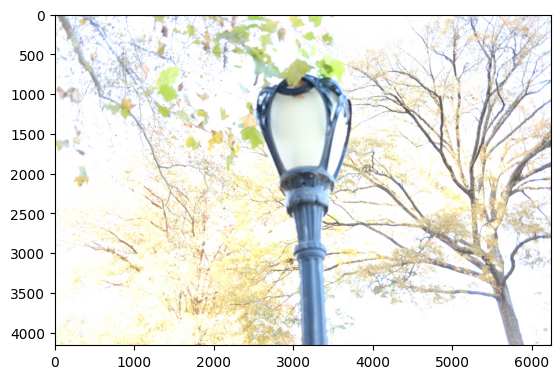

In [8]:
image = Image.open(path + "/DSCF0091.jpg") #example image
plt.imshow(image)

In [9]:
print(image.size) #example conversion from image with pixels and color channels to a 1d flattened array for model usage
img_resized = image.resize((312,208))
img_arr = np.array(img_resized)/255
img_arr_flattened = img_arr.flatten()
print(img_arr_flattened.shape)

(6240, 4160)
(194688,)


In [10]:
def getImageArray(name):#coversion method
  image = Image.open(path + name)
  img_resized = image.resize((312,208))
  img_arr = np.array(img_resized)/255 #/255 to normalize values 0-1
  img_arr = img_arr.flatten()
  return img_arr

In [11]:
exifdf["ImageArray"] = exifdf.apply(lambda row: getImageArray(row["Name"]), axis=1) #apply conversion to all images

In [12]:
exifdf

,Name,ShutterSpeed,ISO,Aperture,CombinationNumber,ImageArray
0,DSCF0091.jpg,0.01,400,2.0,2,"[0.8862745098039215, 0.9254901960784314, 0.988..."
1,DSCF0092.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
2,DSCF0093.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
3,DSCF0094.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.996..."
4,DSCF0095.jpg,0.01,400,2.0,2,"[0.9411764705882353, 0.9568627450980393, 0.992..."
...,...,...,...,...,...,...
115,DSCF0209.jpg,0.0025,400,16.0,12,"[0.06274509803921569, 0.054901960784313725, 0...."
116,DSCF0210.jpg,0.0025,400,16.0,12,"[0.00784313725490196, 0.00784313725490196, 0.0..."
117,DSCF0211.jpg,0.0025,400,16.0,12,"[0.00392156862745098, 0.00392156862745098, 0.0..."
118,DSCF0212.jpg,0.01,400,2.0,2,"[0.45098039215686275, 0.4549019607843137, 0.45..."


In [13]:
#Method to print out images and their respective combination numbers
def display_images(images, combnum, grid_size):
    plt.figure(figsize=(20, 20))
    plt.suptitle(f'Combination Number {combnum}', fontsize=16, ha='left', x=0.13)

    for i, img_array in enumerate(images): #loop through all images with the same combination number
        img_shape = (208, 312, 3)
        img_array_reshaped = img_array.reshape(img_shape) #reshape to correct format for output
        img = Image.fromarray(img_array_reshaped.astype('uint8'))
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(img) #show image
        plt.axis('off')

    plt.subplots_adjust(top=0.95, bottom=0.55, hspace=0.2)

    plt.show()

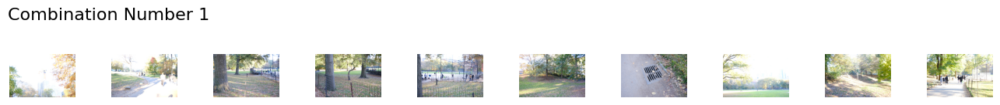

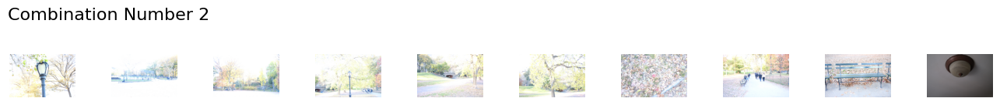

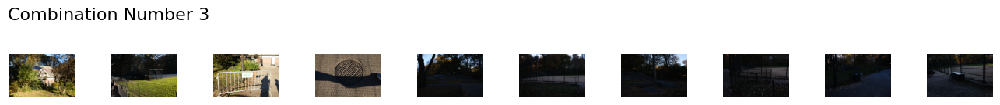

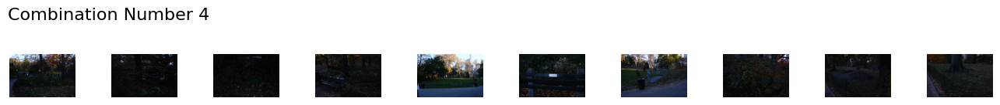

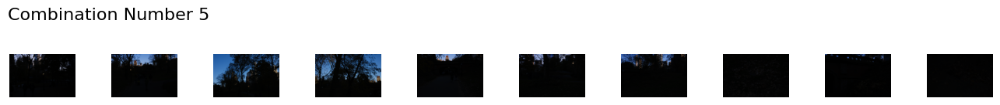

...

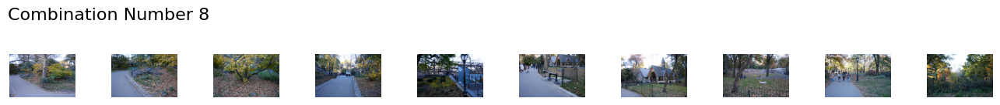

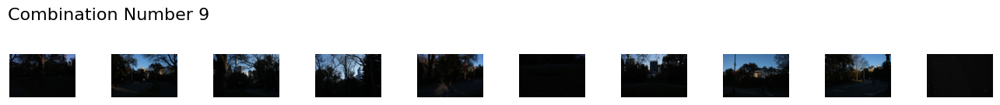

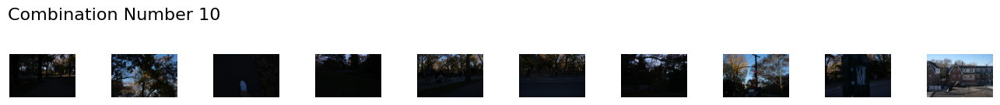

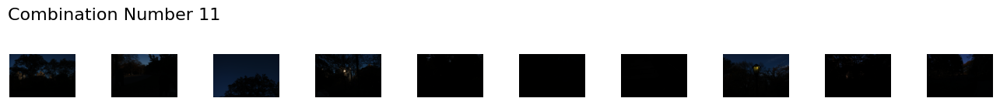

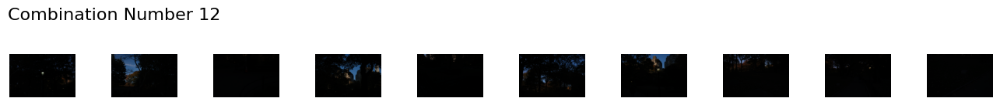

In [14]:
for label, image in exifdf.groupby('CombinationNumber'): #print out images and their combination numbers
    images = image['ImageArray'].values*255
    display_images(images, label, grid_size=12) 

### Clustering

#### Elbow Method

In [15]:
X = np.vstack(exifdf["ImageArray"].values) #convert images into a vstack (list of lists) for clustering

In [16]:
X.shape

(120, 194688)

In [17]:
distortions = [] #apply elbow method to choose best num clusters, k
K = range(2,16)
for k in K:
    k_means = KMeans(n_clusters=k, random_state=42)
    k_means.fit(X)
    distortions.append(k_means.inertia_)

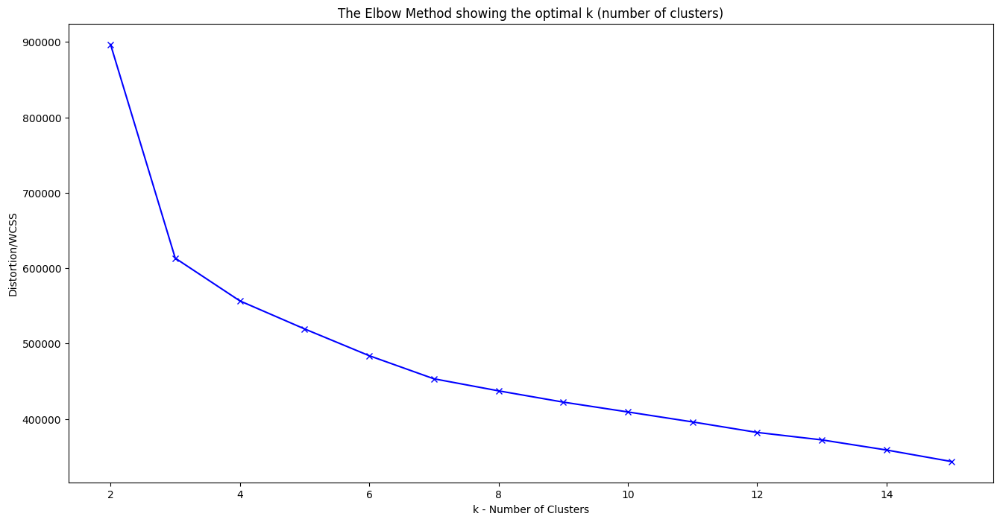

In [18]:
plt.figure(figsize=(16,8))#plot distortion to find best k
plt.plot(K, distortions, 'bx-')
plt.xlabel('k - Number of Clusters')
plt.ylabel('Distortion/WCSS')
plt.title('The Elbow Method showing the optimal k (number of clusters)')
plt.show()

In this case, the best number of clusters (where the inflection takes place) is at k=3. We will cluster with both 2,3 and 12 as k due to how we know there are 2 shutterspeed and iso settings, 3 Aperture settings and 12 combination settings. We have domain knowledge that we can apply here. 

In [19]:
# Function to display all images in a grid for a specific cluster
def display_cluster_images(images, cluster_label, grid_size):
    plt.figure(figsize=(20, 20))
    plt.suptitle(f'Cluster {cluster_label}', fontsize=16, ha='left', x=0.13)

    for i, img_array in enumerate(images):
        img_shape = (208, 312, 3)
        img_array_reshaped = img_array.reshape(img_shape)
        img = Image.fromarray(img_array_reshaped.astype('uint8'))
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(img)
        plt.axis('off')

    plt.subplots_adjust(top=0.95, bottom=0.55, hspace=0.2)

    plt.show()

#### KMeans with 2 clusters

In [20]:
#Applying k-means clustering with 2 clusters
k_means = KMeans(n_clusters=2, random_state=42)
k_means.fit(X)
labels = k_means.labels_
labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [21]:
exifdfWithLabels = pd.concat((exifdf, pd.DataFrame(labels, columns=["Cluster"])), axis=1) #add clusters in as another column
exifdfWithLabels.head(10)

,Name,ShutterSpeed,ISO,Aperture,CombinationNumber,ImageArray,Cluster
0,DSCF0091.jpg,0.01,400,2.0,2,"[0.8862745098039215, 0.9254901960784314, 0.988...",0
1,DSCF0092.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0
2,DSCF0093.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0
3,DSCF0094.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.996...",0
4,DSCF0095.jpg,0.01,400,2.0,2,"[0.9411764705882353, 0.9568627450980393, 0.992...",0
5,DSCF0096.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0
6,DSCF0097.jpg,0.01,400,2.0,2,"[0.5882352941176471, 0.5843137254901961, 0.615...",0
7,DSCF0098.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0
8,DSCF0099.jpg,0.01,400,2.0,2,"[0.9803921568627451, 0.9333333333333333, 0.898...",0
9,DSCF0102.jpg,0.01,200,2.0,1,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0


In [22]:
print(exifdfWithLabels.groupby('Cluster')["ShutterSpeed"].value_counts()) #print out value counts(combinations) and the number of times each appears in a cluster
print(exifdfWithLabels.groupby('Cluster')["ISO"].value_counts())
print(exifdfWithLabels.groupby('Cluster')["Aperture"].value_counts())
print(exifdfWithLabels.groupby('Cluster')["CombinationNumber"].value_counts())

Cluster  ShutterSpeed
0        0.01            20
         0.0025           7
1        0.0025          53
         0.01            40
Name: ShutterSpeed, dtype: int64
Cluster  ISO
0        400    15
         200    12
1        200    48
         400    45
Name: ISO, dtype: int64
Cluster  Aperture
0        2.0         26
         8.0          1
1        16.0        40
         8.0         39
         2.0         14
Name: Aperture, dtype: int64
Cluster  CombinationNumber
0        1                    10
         2                     9
         8                     6
         3                     1
         7                     1
1        4                    10
         5                    10
         6                    10
         9                    10
         10                   10
         11                   10
         12                   10
         3                     9
         7                     9
         8                     4
         2                     

In [23]:
exifdfWithLabels.groupby('Cluster')["ShutterSpeed", "ISO", "Aperture", "CombinationNumber"].value_counts()

Cluster  ShutterSpeed  ISO  Aperture  CombinationNumber
0        0.01          200  2.0       1                    10
                       400  2.0       2                     9
         0.0025        400  2.0       8                     6
                       200  2.0       7                     1
         0.01          200  8.0       3                     1
1        0.0025        200  8.0       9                    10
                            16.0      11                   10
                       400  8.0       10                   10
                            16.0      12                   10
         0.01          200  16.0      5                    10
                       400  8.0       4                    10
                            16.0      6                    10
         0.0025        200  2.0       7                     9
         0.01          200  8.0       3                     9
         0.0025        400  2.0       8                     4
         0.01 

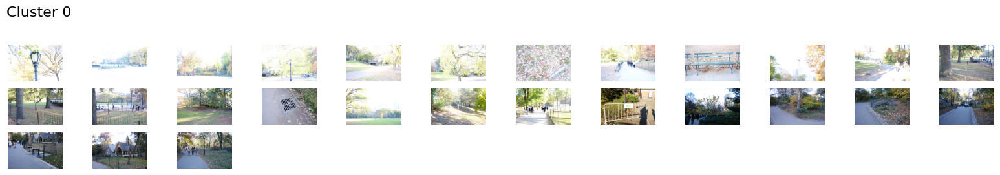

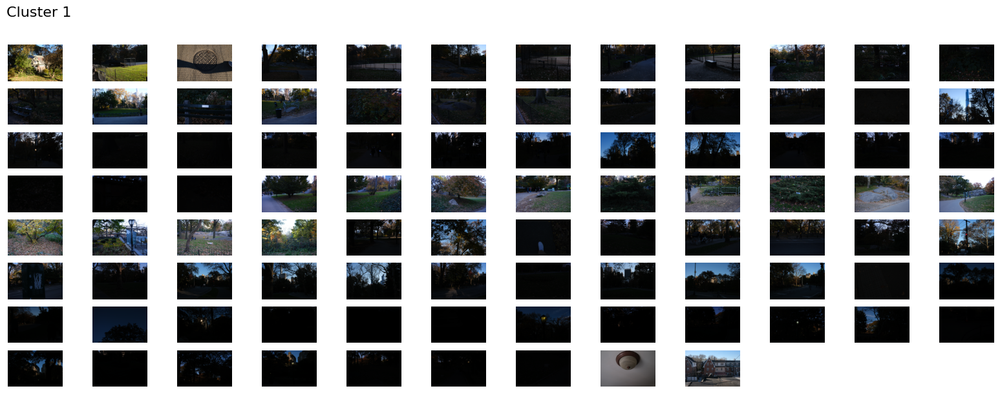

In [24]:
for cluster_label, cluster_df in exifdfWithLabels.groupby('Cluster'): #print out images by cluster
    images = cluster_df['ImageArray'].values*255
    display_cluster_images(images, cluster_label, grid_size=12) 

#### KMeans with 3 clusters

In [25]:
#Applying k-means clustering with 3 clusters
k_means = KMeans(n_clusters=3, random_state=42) 
k_means.fit(X)
labels = k_means.labels_
labels

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 2, 0,
       0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0, 0,
       2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 0, 0])

In [26]:
exifdfWithLabels3 = pd.concat((exifdf, pd.DataFrame(labels, columns=["Cluster"])), axis=1)#add clusters in as another column
exifdfWithLabels3.head(10)

,Name,ShutterSpeed,ISO,Aperture,CombinationNumber,ImageArray,Cluster
0,DSCF0091.jpg,0.01,400,2.0,2,"[0.8862745098039215, 0.9254901960784314, 0.988...",1
1,DSCF0092.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1
2,DSCF0093.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1
3,DSCF0094.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.996...",1
4,DSCF0095.jpg,0.01,400,2.0,2,"[0.9411764705882353, 0.9568627450980393, 0.992...",1
5,DSCF0096.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1
6,DSCF0097.jpg,0.01,400,2.0,2,"[0.5882352941176471, 0.5843137254901961, 0.615...",1
7,DSCF0098.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1
8,DSCF0099.jpg,0.01,400,2.0,2,"[0.9803921568627451, 0.9333333333333333, 0.898...",1
9,DSCF0102.jpg,0.01,200,2.0,1,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",1


In [27]:
print(exifdfWithLabels3.groupby('Cluster')["ShutterSpeed"].value_counts())  #print out value counts(combinations) and the number of times each appears in a cluster
print(exifdfWithLabels3.groupby('Cluster')["ISO"].value_counts())
print(exifdfWithLabels3.groupby('Cluster')["Aperture"].value_counts())
print(exifdfWithLabels3.groupby('Cluster')["CombinationNumber"].value_counts())

Cluster  ShutterSpeed
0        0.0025          18
         0.01             9
1        0.01            16
2        0.0025          42
         0.01            35
Name: ShutterSpeed, dtype: int64
Cluster  ISO
0        400    15
         200    12
1        400     9
         200     7
2        200    41
         400    36
Name: ISO, dtype: int64
Cluster  Aperture
0        2.0         20
         8.0          6
         16.0         1
1        2.0         16
2        16.0        39
         8.0         34
         2.0          4
Name: Aperture, dtype: int64
Cluster  CombinationNumber
0        8                    10
         7                     6
         1                     3
         3                     3
         10                    2
         2                     1
         4                     1
         6                     1
1        2                     9
         1                     7
2        5                    10
         9                    10
         11     

In [28]:
exifdfWithLabels3.groupby('Cluster')["ShutterSpeed", "ISO", "Aperture", "CombinationNumber"].value_counts()

Cluster  ShutterSpeed  ISO  Aperture  CombinationNumber
0        0.0025        400  2.0       8                    10
                       200  2.0       7                     6
         0.01          200  8.0       3                     3
                            2.0       1                     3
         0.0025        400  8.0       10                    2
         0.01          400  16.0      6                     1
                            8.0       4                     1
                            2.0       2                     1
1        0.01          400  2.0       2                     9
                       200  2.0       1                     7
2        0.01          200  16.0      5                    10
         0.0025        400  16.0      12                   10
                       200  16.0      11                   10
                            8.0       9                    10
         0.01          400  8.0       4                     9
              

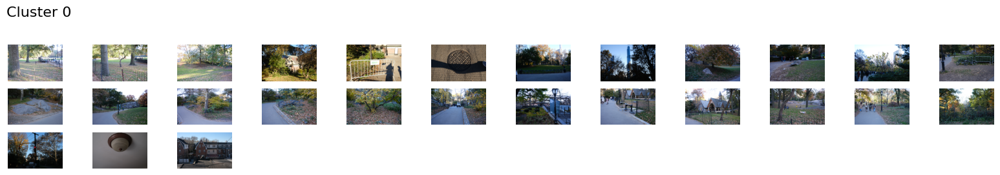

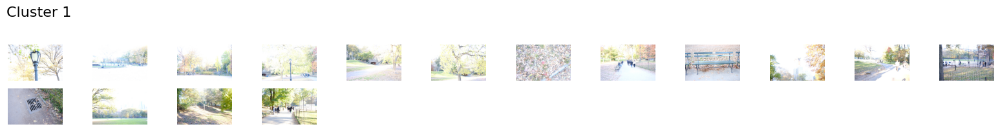

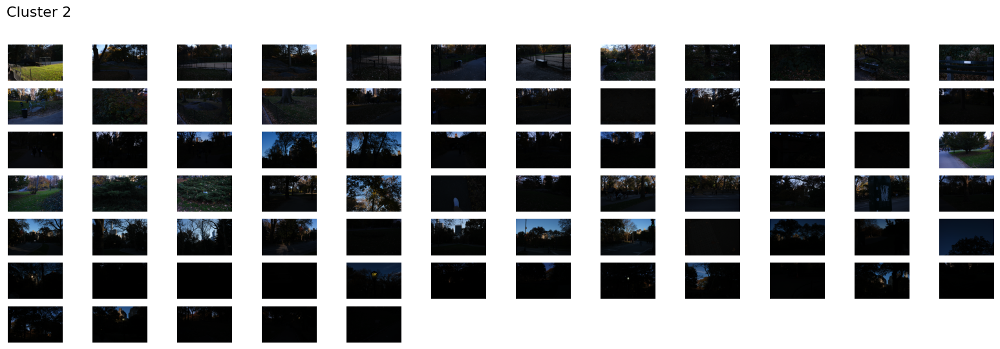

In [29]:
for cluster_label, cluster_df in exifdfWithLabels3.groupby('Cluster'): #print out images by cluster
    images = cluster_df['ImageArray'].values*255
    display_cluster_images(images, cluster_label, grid_size=12)

#### KMeans with 12 clusters

In [30]:
#Applying k-means clustering with 12 clusters
k_means = KMeans(n_clusters=12, random_state=42)
k_means.fit(X)
labels = k_means.labels_
labels

array([ 4,  4,  4,  4,  4,  4,  1,  4,  1,  4,  4,  5,  5,  5,  5,  5,  4,
        1,  1,  2,  9,  7,  2,  3,  3,  3,  0,  0,  0,  3,  0,  0,  0,  6,
        0,  3,  0,  0,  0,  0,  0,  0,  0,  8,  3,  0,  0,  0,  0,  0,  3,
        3,  3,  0,  0,  0,  0,  0,  0,  9,  3,  3,  9,  3, 10,  9,  3,  9,
        6, 11, 11,  2,  2,  6, 11, 10,  2, 11,  2,  0,  9,  0,  0,  3,  0,
        3,  3,  0,  0,  3,  3,  3,  0,  0,  3,  3,  3,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  9,
       10])

In [31]:
exifdfWithLabels12 = pd.concat((exifdf, pd.DataFrame(labels, columns=["Cluster"])), axis=1) #add clusters in as another column
exifdfWithLabels12.head(10)

,Name,ShutterSpeed,ISO,Aperture,CombinationNumber,ImageArray,Cluster
0,DSCF0091.jpg,0.01,400,2.0,2,"[0.8862745098039215, 0.9254901960784314, 0.988...",4
1,DSCF0092.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",4
2,DSCF0093.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",4
3,DSCF0094.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.996...",4
4,DSCF0095.jpg,0.01,400,2.0,2,"[0.9411764705882353, 0.9568627450980393, 0.992...",4
5,DSCF0096.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",4
6,DSCF0097.jpg,0.01,400,2.0,2,"[0.5882352941176471, 0.5843137254901961, 0.615...",1
7,DSCF0098.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",4
8,DSCF0099.jpg,0.01,400,2.0,2,"[0.9803921568627451, 0.9333333333333333, 0.898...",1
9,DSCF0102.jpg,0.01,200,2.0,1,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",4


In [32]:
print(exifdfWithLabels12.groupby('Cluster')["ShutterSpeed"].value_counts()) #print out value counts(combinations) and the number of times each appears in a cluster
print(exifdfWithLabels12.groupby('Cluster')["ISO"].value_counts())
print(exifdfWithLabels12.groupby('Cluster')["Aperture"].value_counts())
print(exifdfWithLabels12.groupby('Cluster')["CombinationNumber"].value_counts())

Cluster  ShutterSpeed
0        0.0025          29
         0.01            25
1        0.01             4
2        0.0025           4
         0.01             2
3        0.0025          13
         0.01             9
4        0.01            10
5        0.01             5
6        0.0025           2
         0.01             1
7        0.01             1
8        0.01             1
9        0.0025           5
         0.01             2
10       0.0025           3
11       0.0025           4
Name: ShutterSpeed, dtype: int64
Cluster  ISO
0        400    30
         200    24
1        200     2
         400     2
2        400     4
         200     2
3        200    16
         400     6
4        400     7
         200     3
5        200     5
6        400     2
         200     1
7        200     1
8        400     1
9        200     5
         400     2
10       400     2
         200     1
11       400     4
Name: ISO, dtype: int64
Cluster  Aperture
0        16.0        35
         8

In [33]:
exifdfWithLabels12.groupby('Cluster')["ShutterSpeed", "ISO", "Aperture", "CombinationNumber"].value_counts()

Cluster  ShutterSpeed  ISO  Aperture  CombinationNumber
0        0.0025        400  16.0      12                   10
                       200  16.0      11                   10
         0.01          400  16.0      6                     8
                       200  16.0      5                     7
                       400  8.0       4                     7
         0.0025        400  8.0       10                    5
                       200  8.0       9                     4
         0.01          200  8.0       3                     3
1        0.01          200  2.0       1                     2
                       400  2.0       2                     2
2        0.0025        400  2.0       8                     4
         0.01          200  8.0       3                     2
3        0.0025        200  8.0       9                     6
                            2.0       7                     4
         0.01          200  8.0       3                     3
              

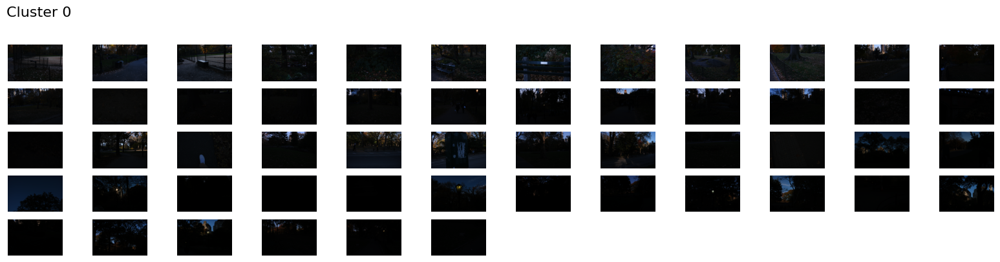

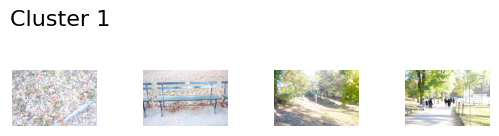

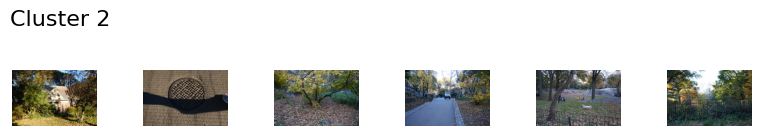

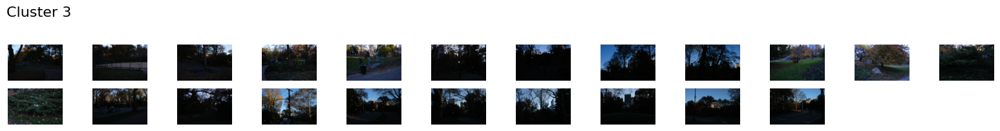

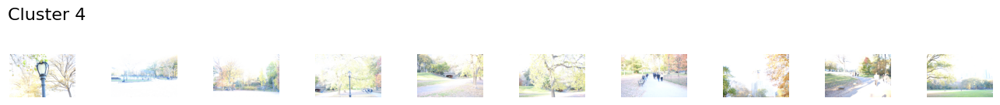

...

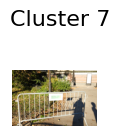

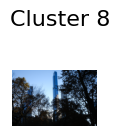

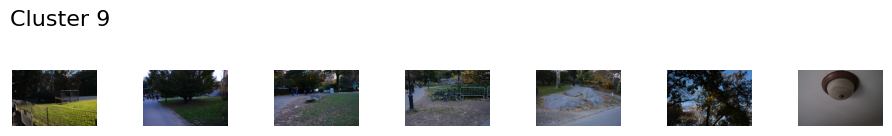

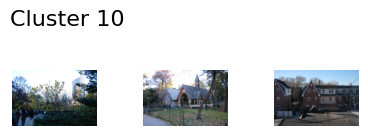

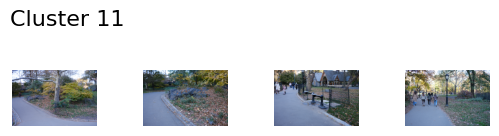

In [34]:
for cluster_label, cluster_df in exifdfWithLabels12.groupby('Cluster'): #print out images by cluster
    images = cluster_df['ImageArray'].values*255
    display_cluster_images(images, cluster_label, grid_size=12) 

### Models

In [35]:
#convert columns into their own lists with correct formatting to allow splitting later on - order is maintained
y_ss = np.where(exifdf['ShutterSpeed'] == 0.01, 0, 1)
conditions = [
    exifdf['Aperture'] == 2.0,
    exifdf['Aperture'] == 8.0,
    exifdf['Aperture'] == 16.0,
]
labels = [0, 1, 2]
y_a = np.select(conditions, labels, default=np.nan)
y_i = np.where(exifdf['ISO'] == 200, 0, 1)
y_c = np.array(exifdf['CombinationNumber']-1)

In [36]:
X_train_ss, X_test_ss, y_train_ss, y_test_ss = train_test_split(X, y_ss, test_size=0.2, stratify=y_ss, random_state=42) #split data multiple times. Each time stratify by a different y such that the class balances are maintained
X_train_a, X_test_a, y_train_a, y_test_a = train_test_split(X, y_a, test_size=0.2, stratify=y_a, random_state=42)
X_train_i, X_test_i, y_train_i, y_test_i = train_test_split(X, y_i, test_size=0.2, stratify=y_i, random_state=42)
X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(X, y_c, test_size=0.2, stratify=y_c, random_state=42)

#### Decision Trees

In [37]:
param_dist = { #create a distribution of parameters for the decision tree methods to use
    'max_depth': [3, None],
    'min_samples_split': randint(2, 11),
    'min_samples_leaf': randint(1, 11),
    'criterion': ['gini', 'entropy']
}

dt_classifier = DecisionTreeClassifier()

stratified_cv = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)

# We are using randomized search cv which randomly selects parameters from the param dist and allows us to apply the model with cross validation
random_search = RandomizedSearchCV(dt_classifier, param_distributions=param_dist, n_iter=25, cv=stratified_cv, scoring='accuracy', random_state=42)

In [38]:
# For shutter speed
# Fit the model with random search and cross-validation
random_search.fit(X_train_ss, y_train_ss)

# Print the best hyperparameters
print("Best Hyperparameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

# Use the best model for predictions
best_dt_model = random_search.best_estimator_
y_pred = best_dt_model.predict(X_test_ss)

# Evaluate the model
accuracy = best_dt_model.score(X_test_ss, y_test_ss)
print(f"Accuracy: {accuracy}")

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 3}
Best Score: 0.71875
Accuracy: 0.5416666666666666


In [39]:
# For aperture
# Fit the model with random search and cross-validation
random_search.fit(X_train_a, y_train_a)

# Print the best hyperparameters
print("Best Hyperparameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

# Use the best model for predictions
best_dt_model = random_search.best_estimator_
y_pred = best_dt_model.predict(X_test_a)

# Evaluate the model
accuracy = best_dt_model.score(X_test_a, y_test_a)
print(f"Accuracy: {accuracy}")

Best Hyperparameters: {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 10}
Best Score: 0.7395833333333334
Accuracy: 0.625


In [40]:
# For ISO 
# Fit the model with random search and cross-validation
random_search.fit(X_train_i, y_train_i)

# Print the best hyperparameters
print("Best Hyperparameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

# Use the best model for predictions
best_dt_model = random_search.best_estimator_
y_pred = best_dt_model.predict(X_test_i)

# Evaluate the model
accuracy = best_dt_model.score(X_test_i, y_test_i)
print(f"Accuracy: {accuracy}")

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 8, 'min_samples_split': 4}
Best Score: 0.5520833333333333
Accuracy: 0.625


In [41]:
# For combination number
# Fit the model with random search and cross-validation
random_search.fit(X_train_c, y_train_c)

# Print the best hyperparameters
print("Best Hyperparameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

# Use the best model for predictions
best_dt_model = random_search.best_estimator_
y_pred = best_dt_model.predict(X_test_c)

# Evaluate the model
accuracy = best_dt_model.score(X_test_c, y_test_c)
print(f"Accuracy: {accuracy}")

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 6, 'min_samples_split': 5}
Best Score: 0.33333333333333337
Accuracy: 0.4583333333333333


#### Random Forest

In [42]:
# Parameter distribution for Random Forest
param_dist = {
    'max_depth': [3, None],
    'min_samples_split': randint(2, 11),
    'min_samples_leaf': randint(1, 11),
    'criterion': ['gini', 'entropy']
}

rf_classifier = RandomForestClassifier()

stratified_cv = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)

random_search_rf = RandomizedSearchCV(rf_classifier, param_distributions=param_dist, n_iter=25, cv=stratified_cv, scoring='accuracy', random_state=42)

In [43]:
# For shutter speed
# Fit the Random Forest model with random search and cross-validation
random_search_rf.fit(X_train_ss, y_train_ss)

# Print the best hyperparameters for Random Forest
print("Best Hyperparameters:", random_search_rf.best_params_)
print("Best Score:", random_search_rf.best_score_)

# Use the best Random Forest model for predictions
best_rf_model = random_search_rf.best_estimator_
y_pred_rf = best_rf_model.predict(X_test_ss)

# Evaluate the Random Forest model
accuracy_rf = best_rf_model.score(X_test_ss, y_test_ss)
print(f"Accuracy: {accuracy_rf}")

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 6, 'min_samples_split': 3}
Best Score: 0.71875
Accuracy: 0.7083333333333334


In [44]:
# For aperture
# Fit the Random Forest model with random search and cross-validation
random_search_rf.fit(X_train_a, y_train_a)
    
# Print the best hyperparameters for Random Forest
print("Best Hyperparameters:", random_search_rf.best_params_)
print("Best Score:", random_search_rf.best_score_)

# Use the best Random Forest model for predictions
best_rf_model = random_search_rf.best_estimator_
y_pred_rf = best_rf_model.predict(X_test_a)

# Evaluate the Random Forest model
accuracy_rf = best_rf_model.score(X_test_a, y_test_a)
print(f"Accuracy: {accuracy_rf}")


Best Hyperparameters: {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 8, 'min_samples_split': 6}
Best Score: 0.84375
Accuracy: 0.7916666666666666


In [45]:
# For ISO
# Fit the Random Forest model with random search and cross-validation
random_search_rf.fit(X_train_i, y_train_i)

# Print the best hyperparameters for Random Forest
print("Best Hyperparameters:", random_search_rf.best_params_)
print("Best Score:", random_search_rf.best_score_)

# Use the best Random Forest model for predictions
best_rf_model = random_search_rf.best_estimator_
y_pred_rf = best_rf_model.predict(X_test_i)

# Evaluate the Random Forest model
accuracy_rf = best_rf_model.score(X_test_i, y_test_i)
print(f"Accuracy: {accuracy_rf}")


Best Hyperparameters: {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 10}
Best Score: 0.6354166666666667
Accuracy: 0.5833333333333334


In [46]:
# For combination number
# Fit the Random Forest model with random search and cross-validation
random_search_rf.fit(X_train_c, y_train_c)

# Print the best hyperparameters for Random Forest
print("Best Hyperparameters:", random_search_rf.best_params_)
print("Best Score:", random_search_rf.best_score_)

# Use the best Random Forest model for predictions
best_rf_model = random_search_rf.best_estimator_
best_rf_comb = random_search_rf.best_estimator_
y_pred_rf = best_rf_model.predict(X_test_c)

# Evaluate the Random Forest model
accuracy_rf = best_rf_model.score(X_test_c, y_test_c)
print(f"Accuracy: {accuracy_rf}")


Best Hyperparameters: {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 3, 'min_samples_split': 8}
Best Score: 0.5416666666666667
Accuracy: 0.5


#### XGBoost

In [47]:
# Parameter distribution for XGBoost
param_dist = {
    'max_depth': randint(1, 10),
    'learning_rate': uniform(0.01, 0.3),
    'n_estimators': randint(50, 200),
    'min_child_weight': randint(1, 10)
}

xgb_classifier = XGBClassifier()

stratified_cv = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)

random_search_xgb = RandomizedSearchCV(xgb_classifier, param_distributions=param_dist, n_iter=5, cv=stratified_cv, scoring='accuracy', random_state=42)

In [48]:
# For shutter speed
# Fit the XGBoost model with random search and cross-validation
random_search_xgb.fit(X_train_ss, y_train_ss)

# Print the best hyperparameters for XGBoost
print("Best Hyperparameters:", random_search_xgb.best_params_)
print("Best Score:", random_search_xgb.best_score_)

# Use the best XGBoost model for predictions
best_xgb_model = random_search_xgb.best_estimator_
y_pred_xgb = best_xgb_model.predict(X_test_ss)

# Evaluate the XGBoost model
accuracy_xgb = best_xgb_model.score(X_test_ss, y_test_ss)
print(f"Accuracy: {accuracy_xgb}")

Best Hyperparameters: {'learning_rate': 0.06454749016213018, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 107}
Best Score: 0.6770833333333333
Accuracy: 0.6666666666666666


In [49]:
# For aperture
# Fit the XGBoost model with random search and cross-validation
random_search_xgb.fit(X_train_a, y_train_a)

# Print the best hyperparameters for XGBoost
print("Best Hyperparameters:", random_search_xgb.best_params_)
print("Best Score:", random_search_xgb.best_score_)

# Use the best XGBoost model for predictions
best_xgb_model = random_search_xgb.best_estimator_
y_pred_xgb = best_xgb_model.predict(X_test_a)

# Evaluate the XGBoost model
accuracy_xgb = best_xgb_model.score(X_test_a, y_test_a)
print(f"Accuracy: {accuracy_xgb}")

Best Hyperparameters: {'learning_rate': 0.02692347370813008, 'max_depth': 8, 'min_child_weight': 6, 'n_estimators': 179}
Best Score: 0.7395833333333333
Accuracy: 0.8333333333333334


In [50]:
# For ISO
# Fit the XGBoost model with random search and cross-validation
random_search_xgb.fit(X_train_i, y_train_i)

# Print the best hyperparameters for XGBoost
print("Best Hyperparameters:", random_search_xgb.best_params_)
print("Best Score:", random_search_xgb.best_score_)

# Use the best XGBoost model for predictions
best_xgb_model = random_search_xgb.best_estimator_
y_pred_xgb = best_xgb_model.predict(X_test_i)

# Evaluate the XGBoost model
accuracy_xgb = best_xgb_model.score(X_test_i, y_test_i)
print(f"Accuracy: {accuracy_xgb}")

Best Hyperparameters: {'learning_rate': 0.02692347370813008, 'max_depth': 8, 'min_child_weight': 6, 'n_estimators': 179}
Best Score: 0.5625
Accuracy: 0.7083333333333334


In [51]:
# For combination number
# Fit the XGBoost model with random search and cross-validation
random_search_xgb.fit(X_train_c, y_train_c)

# Print the best hyperparameters for XGBoost
print("Best Hyperparameters:", random_search_xgb.best_params_)
print("Best Score:", random_search_xgb.best_score_)

# Use the best XGBoost model for predictions
best_xgb_model = random_search_xgb.best_estimator_
y_pred_xgb = best_xgb_model.predict(X_test_c)

# Evaluate the XGBoost model
accuracy_xgb = best_xgb_model.score(X_test_c, y_test_c)
print(f"Accuracy: {accuracy_xgb}")

Best Hyperparameters: {'learning_rate': 0.19033450352296263, 'max_depth': 8, 'min_child_weight': 3, 'n_estimators': 199}
Best Score: 0.3645833333333333
Accuracy: 0.375


#### AdaBoost

In [52]:
# Parameter distribution for AdaBoost with DecisionTree base estimator
param_dist = {
    'base_estimator__max_depth': randint(1, 10),
    'learning_rate': uniform(0.01, 0.3),
    'n_estimators': randint(50, 200),
}

base_estimator = DecisionTreeClassifier()
ada_classifier = AdaBoostClassifier(base_estimator=base_estimator)

stratified_cv = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)

random_search_ada = RandomizedSearchCV(ada_classifier, param_distributions=param_dist, n_iter=5, cv=stratified_cv, scoring='accuracy', random_state=42)

In [53]:
# For shutter speed
# Fit the AdaBoost with random search and cross-validation
random_search_ada.fit(X_train_ss, y_train_ss)

# Print the best hyperparameters for AdaBoost
print("Best Hyperparameters:", random_search_ada.best_params_)
print("Best Score:", random_search_ada.best_score_)

# Use the best AdaBoost model for predictions
best_ada_model = random_search_ada.best_estimator_
y_pred_xgb = best_ada_model.predict(X_test_ss)

# Evaluate the AdaBoost model
accuracy_ada = best_ada_model.score(X_test_ss, y_test_ss)
print(f"Accuracy: {accuracy_ada}")

Best Hyperparameters: {'base_estimator__max_depth': 5, 'learning_rate': 0.19033450352296263, 'n_estimators': 180}
Best Score: 0.6458333333333334
Accuracy: 0.5416666666666666


In [54]:
# For aperture
# Fit the AdaBoost with random search and cross-validation
random_search_ada.fit(X_train_a, y_train_a)

# Print the best hyperparameters for AdaBoost
print("Best Hyperparameters:", random_search_ada.best_params_)
print("Best Score:", random_search_ada.best_score_)

# Use the best AdaBoost model for predictions
best_ada_model = random_search_ada.best_estimator_
y_pred_xgb = best_ada_model.predict(X_test_a)

# Evaluate the AdaBoost model
accuracy_ada = best_ada_model.score(X_test_a, y_test_a)
print(f"Accuracy: {accuracy_ada}")

Best Hyperparameters: {'base_estimator__max_depth': 7, 'learning_rate': 0.24896289605806984, 'n_estimators': 64}
Best Score: 0.7291666666666667
Accuracy: 0.6666666666666666


In [55]:
# For ISO
# Fit the AdaBoost with random search and cross-validation
random_search_ada.fit(X_train_i, y_train_i)

# Print the best hyperparameters for AdaBoost
print("Best Hyperparameters:", random_search_ada.best_params_)
print("Best Score:", random_search_ada.best_score_)

# Use the best AdaBoost model for predictions
best_ada_model = random_search_ada.best_estimator_
y_pred_xgb = best_ada_model.predict(X_test_i)

# Evaluate the AdaBoost model
accuracy_ada = best_ada_model.score(X_test_i, y_test_i)
print(f"Accuracy: {accuracy_ada}")

Best Hyperparameters: {'base_estimator__max_depth': 8, 'learning_rate': 0.189597545259111, 'n_estimators': 152}
Best Score: 0.47916666666666663
Accuracy: 0.4583333333333333


### With Feature Engineering

#### Feature Engineering Setup

In [56]:
def getImageMean(image): #returns the mean value of all pixels in an image
    return np.mean(image)

In [57]:
def getLaplacianValue(image): #returns the laplacian variance of an image
    laplacian_value = cv2.Laplacian(image, cv2.CV_64F).var()
    return laplacian_value

In [58]:
def getDirectionalBlurValue(image): #returns the maximum directional blur of an image, explanation in paper
    dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))

    directional_profile_horizontal = np.average(magnitude_spectrum, axis=0)
    directional_profile_vertical = np.average(magnitude_spectrum, axis=1)

    directional_blur_horizontal = np.sum(np.diff(directional_profile_horizontal))
    directional_blur_vertical = np.sum(np.diff(directional_profile_vertical))

    directional_blur = max(directional_blur_horizontal, directional_blur_vertical)

    return abs(directional_blur)

In [59]:
def getNoiseLevel(image): #returns the noise level of an image, explanation in paper
    diff_vertical = np.std(np.diff(image, axis=0))
    diff_horizontal = np.std(np.diff(image, axis=1))
    noise_level = diff_vertical + diff_horizontal
    return noise_level

In [60]:
for index, name in exifdf.iterrows(): #converts all images to grayscale, applies methods and adds as extra columns in the df, explanation in paper
    img_arr_reshaped = name['ImageArray'].reshape(208,312,3)
    img_arr_reshaped = (img_arr_reshaped*255).astype(np.uint8)
    gray_image = cv2.cvtColor(img_arr_reshaped, cv2.COLOR_BGR2GRAY)
    gray_image_normalized = gray_image/255
    
    exifdf.loc[index, "DirectionalBlur"] = getDirectionalBlurValue(gray_image_normalized)
    exifdf.loc[index, "Mean"] = getImageMean(gray_image_normalized)
    exifdf.loc[index, "NoiseLevel"] = getNoiseLevel(gray_image_normalized)
    exifdf.loc[index, "Laplacian"] = getLaplacianValue(gray_image_normalized)

scaler = MinMaxScaler()
exifdf['DirectionalBlur'] = scaler.fit_transform(exifdf[['DirectionalBlur']])

In [61]:
exifdf.head(10)

,Name,ShutterSpeed,ISO,Aperture,CombinationNumber,ImageArray,DirectionalBlur,Mean,NoiseLevel,Laplacian
0,DSCF0091.jpg,0.01,400,2.0,2,"[0.8862745098039215, 0.9254901960784314, 0.988...",0.172674,0.899195,0.149693,0.029240
1,DSCF0092.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.183478,0.948829,0.070023,0.006719
2,DSCF0093.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.314411,0.899341,0.088604,0.011536
3,DSCF0094.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.996...",0.090797,0.909530,0.100595,0.014843
4,DSCF0095.jpg,0.01,400,2.0,2,"[0.9411764705882353, 0.9568627450980393, 0.992...",0.136614,0.864930,0.103328,0.015745
5,DSCF0096.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.082553,0.887115,0.123668,0.022068
6,DSCF0097.jpg,0.01,400,2.0,2,"[0.5882352941176471, 0.5843137254901961, 0.615...",0.092346,0.811231,0.198439,0.058770
7,DSCF0098.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.346517,0.877887,0.109836,0.017298
8,DSCF0099.jpg,0.01,400,2.0,2,"[0.9803921568627451, 0.9333333333333333, 0.898...",0.274836,0.789132,0.161974,0.040029
9,DSCF0102.jpg,0.01,200,2.0,1,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.211290,0.888548,0.129118,0.024848


In [62]:
X2 = exifdf[['Mean', 'DirectionalBlur', 'NoiseLevel', 'Laplacian']] #Create X2 with only the created columns
X2.head(5)

,Mean,DirectionalBlur,NoiseLevel,Laplacian
0,0.899195,0.172674,0.149693,0.029240
1,0.948829,0.183478,0.070023,0.006719
2,0.899341,0.314411,0.088604,0.011536
3,0.909530,0.090797,0.100595,0.014843
4,0.864930,0.136614,0.103328,0.015745


#### Clustering with FE

##### Elbow Method with FE

In [63]:
distortions = [] #apply elbow method to choose best num clusters, k
K = range(2,16)
for k in K:
    k_means = KMeans(n_clusters=k, random_state=42)
    k_means.fit(X2)
    distortions.append(k_means.inertia_)

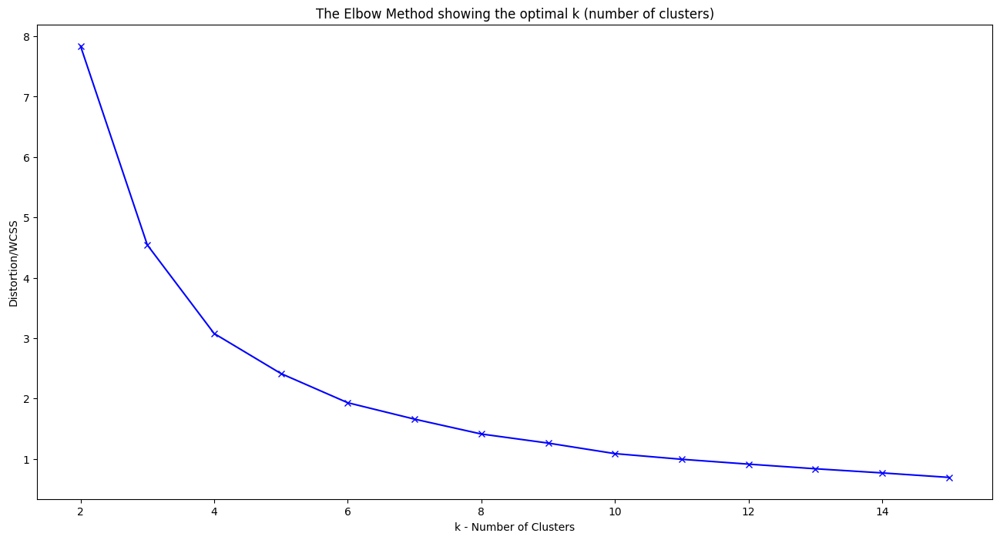

In [64]:
plt.figure(figsize=(16,8))#plot distortion to find best k
plt.plot(K, distortions, 'bx-')
plt.xlabel('k - Number of Clusters')
plt.ylabel('Distortion/WCSS')
plt.title('The Elbow Method showing the optimal k (number of clusters)')
plt.show()

##### KMeans with 2 clusters and FE

In [65]:
#Applying k-means clustering with 2 clusters
k_means = KMeans(n_clusters=2, random_state=42)
k_means.fit(X2)
labels = k_means.labels_
labels

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [66]:
exifdfWithLabelsFE = pd.concat((exifdf, pd.DataFrame(labels, columns=["Cluster"])), axis=1) #add clusters in as another column
exifdfWithLabelsFE.head(10)

,Name,ShutterSpeed,ISO,Aperture,CombinationNumber,ImageArray,DirectionalBlur,Mean,NoiseLevel,Laplacian,Cluster
0,DSCF0091.jpg,0.01,400,2.0,2,"[0.8862745098039215, 0.9254901960784314, 0.988...",0.172674,0.899195,0.149693,0.029240,1
1,DSCF0092.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.183478,0.948829,0.070023,0.006719,1
2,DSCF0093.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.314411,0.899341,0.088604,0.011536,1
3,DSCF0094.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.996...",0.090797,0.909530,0.100595,0.014843,1
4,DSCF0095.jpg,0.01,400,2.0,2,"[0.9411764705882353, 0.9568627450980393, 0.992...",0.136614,0.864930,0.103328,0.015745,1
5,DSCF0096.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.082553,0.887115,0.123668,0.022068,1
6,DSCF0097.jpg,0.01,400,2.0,2,"[0.5882352941176471, 0.5843137254901961, 0.615...",0.092346,0.811231,0.198439,0.058770,1
7,DSCF0098.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.346517,0.877887,0.109836,0.017298,1
8,DSCF0099.jpg,0.01,400,2.0,2,"[0.9803921568627451, 0.9333333333333333, 0.898...",0.274836,0.789132,0.161974,0.040029,1
9,DSCF0102.jpg,0.01,200,2.0,1,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.211290,0.888548,0.129118,0.024848,1


In [67]:
print(exifdfWithLabelsFE.groupby('Cluster')["ShutterSpeed"].value_counts()) #print out value counts(combinations) and the number of times each appears in a cluster
print(exifdfWithLabelsFE.groupby('Cluster')["ISO"].value_counts())
print(exifdfWithLabelsFE.groupby('Cluster')["Aperture"].value_counts())
print(exifdfWithLabelsFE.groupby('Cluster')["CombinationNumber"].value_counts())

Cluster  ShutterSpeed
0        0.0025          54
         0.01            40
1        0.01            20
         0.0025           6
Name: ShutterSpeed, dtype: int64
Cluster  ISO
0        200    48
         400    46
1        400    14
         200    12
Name: ISO, dtype: int64
Cluster  Aperture
0        16.0        40
         8.0         39
         2.0         15
1        2.0         25
         8.0          1
Name: Aperture, dtype: int64
Cluster  CombinationNumber
0        4                    10
         5                    10
         6                    10
         9                    10
         10                   10
         11                   10
         12                   10
         3                     9
         7                     9
         8                     5
         2                     1
1        1                    10
         2                     9
         8                     5
         3                     1
         7                     

In [68]:
exifdfWithLabelsFE.groupby('Cluster')["ShutterSpeed", "ISO", "Aperture", "CombinationNumber"].value_counts()

Cluster  ShutterSpeed  ISO  Aperture  CombinationNumber
0        0.0025        200  8.0       9                    10
                            16.0      11                   10
                       400  8.0       10                   10
                            16.0      12                   10
         0.01          200  16.0      5                    10
                       400  8.0       4                    10
                            16.0      6                    10
         0.0025        200  2.0       7                     9
         0.01          200  8.0       3                     9
         0.0025        400  2.0       8                     5
         0.01          400  2.0       2                     1
1        0.01          200  2.0       1                    10
                       400  2.0       2                     9
         0.0025        400  2.0       8                     5
                       200  2.0       7                     1
         0.01 

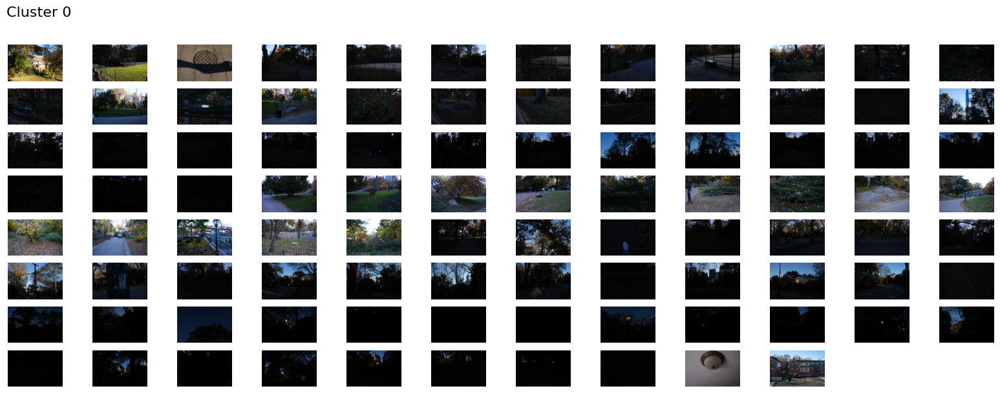

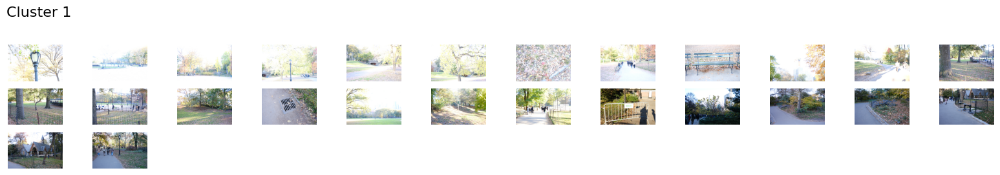

In [69]:
for cluster_label, cluster_df in exifdfWithLabelsFE.groupby('Cluster'): #print out images by cluster
    images = cluster_df['ImageArray'].values*255
    display_cluster_images(images, cluster_label, grid_size=12) 

##### KMeans with 3 clusters and FE

In [70]:
#Applying k-means clustering with 3 clusters
k_means = KMeans(n_clusters=3, random_state=42) 
k_means.fit(X2)
labels = k_means.labels_
labels

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 1, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0,
       0, 2, 0, 0, 2, 0, 0, 0, 0, 0])

In [71]:
exifdfWithLabels3FE = pd.concat((exifdf, pd.DataFrame(labels, columns=["Cluster"])), axis=1)#add clusters in as another column
exifdfWithLabels3FE.head(10)

,Name,ShutterSpeed,ISO,Aperture,CombinationNumber,ImageArray,DirectionalBlur,Mean,NoiseLevel,Laplacian,Cluster
0,DSCF0091.jpg,0.01,400,2.0,2,"[0.8862745098039215, 0.9254901960784314, 0.988...",0.172674,0.899195,0.149693,0.029240,1
1,DSCF0092.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.183478,0.948829,0.070023,0.006719,1
2,DSCF0093.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.314411,0.899341,0.088604,0.011536,1
3,DSCF0094.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.996...",0.090797,0.909530,0.100595,0.014843,1
4,DSCF0095.jpg,0.01,400,2.0,2,"[0.9411764705882353, 0.9568627450980393, 0.992...",0.136614,0.864930,0.103328,0.015745,1
5,DSCF0096.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.082553,0.887115,0.123668,0.022068,1
6,DSCF0097.jpg,0.01,400,2.0,2,"[0.5882352941176471, 0.5843137254901961, 0.615...",0.092346,0.811231,0.198439,0.058770,1
7,DSCF0098.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.346517,0.877887,0.109836,0.017298,1
8,DSCF0099.jpg,0.01,400,2.0,2,"[0.9803921568627451, 0.9333333333333333, 0.898...",0.274836,0.789132,0.161974,0.040029,1
9,DSCF0102.jpg,0.01,200,2.0,1,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.211290,0.888548,0.129118,0.024848,1


In [72]:
print(exifdfWithLabels3FE.groupby('Cluster')["ShutterSpeed"].value_counts())  #print out value counts(combinations) and the number of times each appears in a cluster
print(exifdfWithLabels3FE.groupby('Cluster')["ISO"].value_counts())
print(exifdfWithLabels3FE.groupby('Cluster')["Aperture"].value_counts())
print(exifdfWithLabels3FE.groupby('Cluster')["CombinationNumber"].value_counts())

Cluster  ShutterSpeed
0        0.0025          45
         0.01            33
1        0.01            20
         0.0025           6
2        0.0025           9
         0.01             7
Name: ShutterSpeed, dtype: int64
Cluster  ISO
0        400    40
         200    38
1        400    14
         200    12
2        200    10
         400     6
Name: ISO, dtype: int64
Cluster  Aperture
0        8.0         32
         16.0        32
         2.0         14
1        2.0         25
         8.0          1
2        16.0         8
         8.0          7
         2.0          1
Name: Aperture, dtype: int64
Cluster  CombinationNumber
0        6                    10
         10                   10
         3                     8
         5                     8
         7                     8
         9                     8
         12                    8
         4                     6
         11                    6
         8                     5
         2                    

In [73]:
exifdfWithLabels3FE.groupby('Cluster')["ShutterSpeed", "ISO", "Aperture", "CombinationNumber"].value_counts()

Cluster  ShutterSpeed  ISO  Aperture  CombinationNumber
0        0.0025        400  8.0       10                   10
         0.01          400  16.0      6                    10
         0.0025        200  2.0       7                     8
                       400  16.0      12                    8
         0.01          200  8.0       3                     8
                            16.0      5                     8
         0.0025        200  8.0       9                     8
                            16.0      11                    6
         0.01          400  8.0       4                     6
         0.0025        400  2.0       8                     5
         0.01          400  2.0       2                     1
1        0.01          200  2.0       1                    10
                       400  2.0       2                     9
         0.0025        400  2.0       8                     5
         0.01          200  8.0       3                     1
         0.002

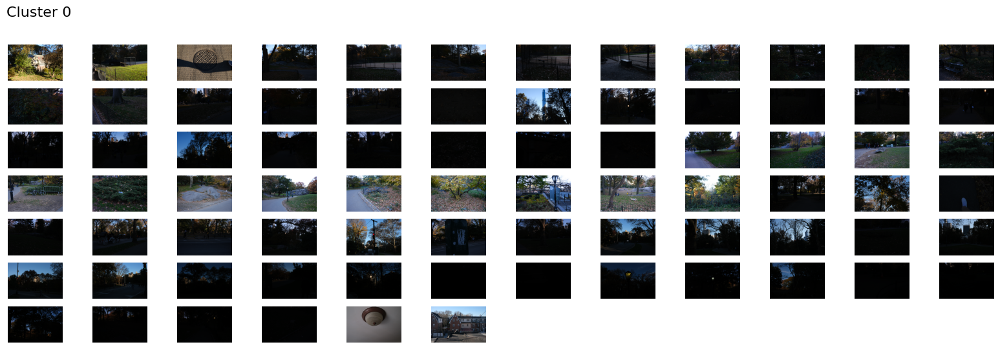

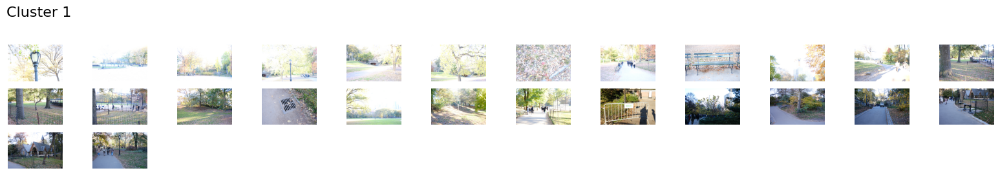

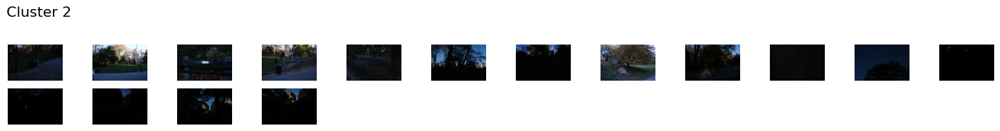

In [74]:
for cluster_label, cluster_df in exifdfWithLabels3FE.groupby('Cluster'): #print out images by cluster
    images = cluster_df['ImageArray'].values*255
    display_cluster_images(images, cluster_label, grid_size=12)

##### KMeans with 12 clusters and FE

In [75]:
#Applying k-means clustering with 12 clusters
k_means = KMeans(n_clusters=12, random_state=42)
k_means.fit(X2)
labels = k_means.labels_
labels

array([ 6,  6,  9,  6,  6,  6,  6,  9,  9,  6,  9,  8,  1,  1,  1,  8,  6,
        1,  9,  4,  0,  4,  4,  0,  7,  0,  3,  2,  3,  0,  3, 11, 11, 10,
        2,  2, 11,  2, 11,  0,  3, 11,  3,  5,  0,  3,  3,  7,  7,  7,  7,
       11,  2,  7,  3,  2,  3,  7,  3,  5,  0,  2,  5,  7,  4,  4,  0,  4,
        5,  8,  4,  4,  8,  5,  4,  8,  5,  8,  4, 11,  5,  3, 11,  7,  0,
       11,  5,  0,  7,  0, 11,  5,  2,  3,  0,  0, 11,  2,  7,  7,  2,  7,
       10, 11,  3, 11,  2, 10, 11,  3,  3,  2,  3,  3, 10,  7,  3,  3,  4,
        8])

In [76]:
exifdfWithLabels12FE = pd.concat((exifdf, pd.DataFrame(labels, columns=["Cluster"])), axis=1) #add clusters in as another column
exifdfWithLabels12FE.head(10)

,Name,ShutterSpeed,ISO,Aperture,CombinationNumber,ImageArray,DirectionalBlur,Mean,NoiseLevel,Laplacian,Cluster
0,DSCF0091.jpg,0.01,400,2.0,2,"[0.8862745098039215, 0.9254901960784314, 0.988...",0.172674,0.899195,0.149693,0.029240,6
1,DSCF0092.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.183478,0.948829,0.070023,0.006719,6
2,DSCF0093.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.314411,0.899341,0.088604,0.011536,9
3,DSCF0094.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.996...",0.090797,0.909530,0.100595,0.014843,6
4,DSCF0095.jpg,0.01,400,2.0,2,"[0.9411764705882353, 0.9568627450980393, 0.992...",0.136614,0.864930,0.103328,0.015745,6
5,DSCF0096.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.082553,0.887115,0.123668,0.022068,6
6,DSCF0097.jpg,0.01,400,2.0,2,"[0.5882352941176471, 0.5843137254901961, 0.615...",0.092346,0.811231,0.198439,0.058770,6
7,DSCF0098.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.346517,0.877887,0.109836,0.017298,9
8,DSCF0099.jpg,0.01,400,2.0,2,"[0.9803921568627451, 0.9333333333333333, 0.898...",0.274836,0.789132,0.161974,0.040029,9
9,DSCF0102.jpg,0.01,200,2.0,1,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.211290,0.888548,0.129118,0.024848,6


In [77]:
print(exifdfWithLabels12FE.groupby('Cluster')["ShutterSpeed"].value_counts()) #print out value counts(combinations) and the number of times each appears in a cluster
print(exifdfWithLabels12FE.groupby('Cluster')["ISO"].value_counts())
print(exifdfWithLabels12FE.groupby('Cluster')["Aperture"].value_counts())
print(exifdfWithLabels12FE.groupby('Cluster')["CombinationNumber"].value_counts())

Cluster  ShutterSpeed
0        0.0025           7
         0.01             6
1        0.01             4
2        0.0025           6
         0.01             6
3        0.01            10
         0.0025           9
4        0.0025           7
         0.01             4
5        0.0025           8
         0.01             1
6        0.01             8
7        0.0025           7
         0.01             7
8        0.0025           5
         0.01             2
9        0.01             5
10       0.0025           3
         0.01             1
11       0.0025           8
         0.01             6
Name: ShutterSpeed, dtype: int64
Cluster  ISO
0        200     8
         400     5
1        200     4
2        200     8
         400     4
3        400    12
         200     7
4        200     6
         400     5
5        400     5
         200     4
6        400     6
         200     2
7        200    10
         400     4
8        400     5
         200     2
9        400     3
  

In [78]:
exifdfWithLabels12FE.groupby('Cluster')["ShutterSpeed", "ISO", "Aperture", "CombinationNumber"].value_counts()

Cluster  ShutterSpeed  ISO  Aperture  CombinationNumber
0        0.0025        200  8.0       9                    3
         0.01          200  8.0       3                    3
         0.0025        200  2.0       7                    2
                       400  8.0       10                   2
         0.01          400  16.0      6                    2
                            8.0       4                    1
1        0.01          200  2.0       1                    4
2        0.01          400  8.0       4                    3
         0.0025        200  8.0       9                    2
                            16.0      11                   2
         0.01          200  16.0      5                    2
                            8.0       3                    1
         0.0025        200  2.0       7                    1
                       400  16.0      12                   1
3        0.0025        400  16.0      12                   6
         0.01          400  1

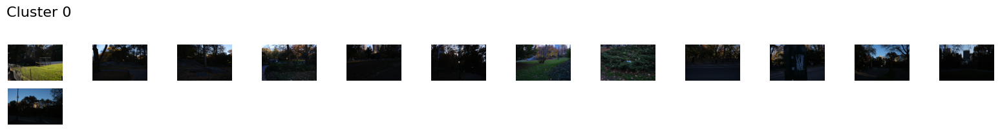

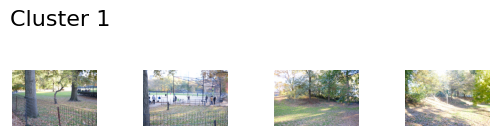

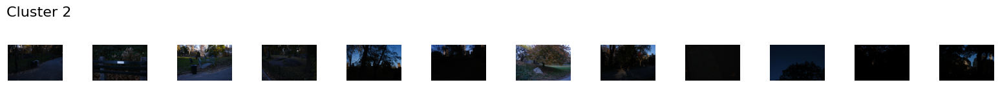

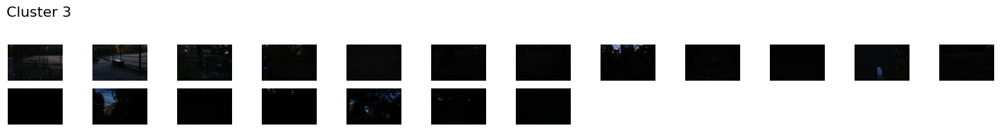

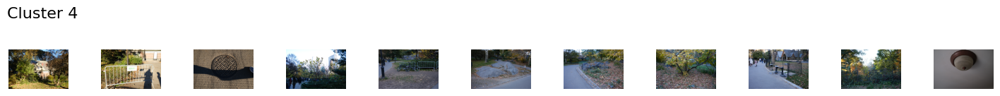

...

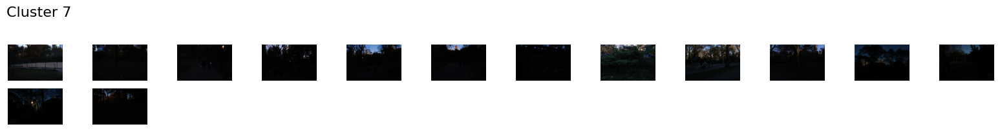

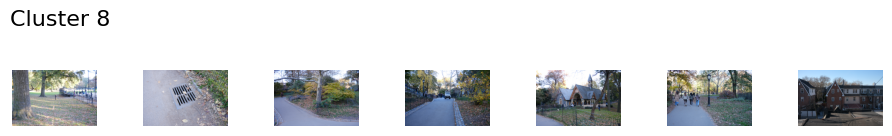

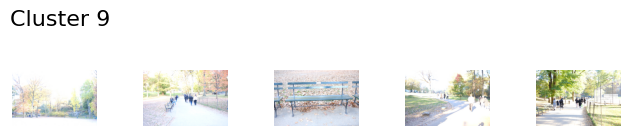

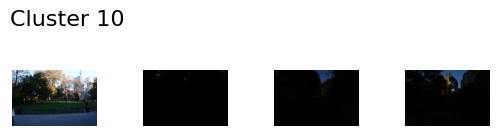

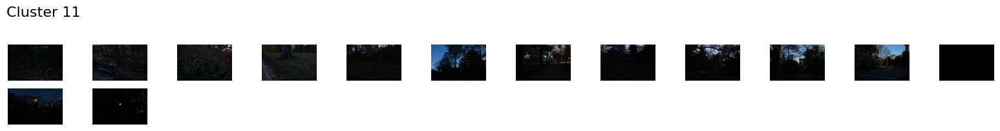

In [79]:
for cluster_label, cluster_df in exifdfWithLabels12FE.groupby('Cluster'): #print out images by cluster
    images = cluster_df['ImageArray'].values*255
    display_cluster_images(images, cluster_label, grid_size=12) 

#### Models with FE

##### Initial Setup

In [80]:
y2_ss = np.where(exifdf['ShutterSpeed'] == 0.01, 0, 1) #convert y labels into correct format
conditions = [
    exifdf['Aperture'] == 2.0,
    exifdf['Aperture'] == 8.0,
    exifdf['Aperture'] == 16.0,
]
labels = [0, 1, 2]
y2_a = np.select(conditions, labels, default=np.nan)
y2_i = np.where(exifdf['ISO'] == 200, 0, 1)
y2_c = np.array(exifdf['CombinationNumber']-1)

In [81]:
X2_train_ss, X2_test_ss, y2_train_ss, y2_test_ss = train_test_split(X2, y2_ss, test_size=0.2, stratify=y2_ss, random_state=42) # split X2, stratify based on settings
X2_train_a, X2_test_a, y2_train_a, y2_test_a = train_test_split(X2, y2_a, test_size=0.2, stratify=y2_a, random_state=42)
X2_train_i, X2_test_i, y2_train_i, y2_test_i = train_test_split(X2, y2_i, test_size=0.2, stratify=y2_i, random_state=42)
X2_train_c, X2_test_c, y2_train_c, y2_test_c = train_test_split(X2, y2_c, test_size=0.2, stratify=y2_c, random_state=42)

##### Decision Trees with FE

In [82]:
param_dist = { #create distribution and setup randomized search cv for featured engineered data
    'max_depth': [3, None],
    'min_samples_split': randint(2, 11),
    'min_samples_leaf': randint(1, 11),
    'criterion': ['gini', 'entropy']
}

dt_classifier = DecisionTreeClassifier()

stratified_cv = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)

random_search = RandomizedSearchCV(dt_classifier, param_distributions=param_dist, n_iter=100, cv=stratified_cv, scoring='accuracy', random_state=42)

In [83]:
#For shutter speed
random_search.fit(X2_train_ss, y2_train_ss)

print("Best Hyperparameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

best_dt_model = random_search.best_estimator_
y_pred = best_dt_model.predict(X2_test_ss)

accuracy = best_dt_model.score(X2_test_ss, y2_test_ss)
print(f"Accuracy: {accuracy}")

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 3, 'min_samples_split': 10}
Best Score: 0.6770833333333334
Accuracy: 0.6666666666666666


In [84]:
#For Aperture
random_search.fit(X2_train_a, y2_train_a)

print("Best Hyperparameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

best_dt_model = random_search.best_estimator_
y_pred = best_dt_model.predict(X2_test_a)

accuracy = best_dt_model.score(X2_test_a, y2_test_a)
print(f"Accuracy: {accuracy}")

Best Hyperparameters: {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 8, 'min_samples_split': 6}
Best Score: 0.7395833333333334
Accuracy: 0.625


In [85]:
# For ISO
random_search.fit(X2_train_i, y2_train_i)

print("Best Hyperparameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

best_dt_model = random_search.best_estimator_
y_pred = best_dt_model.predict(X2_test_i)

accuracy = best_dt_model.score(X2_test_i, y2_test_i)
print(f"Accuracy: {accuracy}")

Best Hyperparameters: {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 6}
Best Score: 0.6041666666666667
Accuracy: 0.5833333333333334


In [86]:
# For combination numbers
random_search.fit(X2_train_c, y2_train_c)

print("Best Hyperparameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

best_dt_model = random_search.best_estimator_
y_pred = best_dt_model.predict(X2_test_c)

accuracy = best_dt_model.score(X2_test_c, y2_test_c)
print(f"Accuracy: {accuracy}")

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 8}
Best Score: 0.3333333333333333
Accuracy: 0.3333333333333333


##### Random Forest with FE

In [87]:
param_dist = {
    'n_estimators': [50, 100, 200, 300, 400, 500], 
    'max_depth': [3, None],
    'min_samples_split': randint(2, 11),
    'min_samples_leaf': randint(1, 11),
    'criterion': ['gini', 'entropy']
}

rf_classifier = RandomForestClassifier()

stratified_cv = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)

random_search_rf = RandomizedSearchCV(rf_classifier, param_distributions=param_dist, n_iter=100, cv=stratified_cv, scoring='accuracy', random_state=42)

In [88]:
# For shutter speed
random_search_rf.fit(X2_train_ss, y2_train_ss)

print("Best Hyperparameters:", random_search_rf.best_params_)
print("Best Score:", random_search_rf.best_score_)

best_rf_model = random_search_rf.best_estimator_
y_pred_rf = best_rf_model.predict(X2_test_ss)

accuracy_rf = best_rf_model.score(X2_test_ss, y2_test_ss)
print(f"Accuracy: {accuracy_rf}")

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 6, 'min_samples_split': 8, 'n_estimators': 100}
Best Score: 0.6875
Accuracy: 0.7916666666666666


In [89]:
# For Aperture
random_search_rf.fit(X2_train_a, y2_train_a)

print("Best Hyperparameters:", random_search_rf.best_params_)
print("Best Score:", random_search_rf.best_score_)

best_rf_model = random_search_rf.best_estimator_
y_pred_rf = best_rf_model.predict(X2_test_a)

accuracy_rf = best_rf_model.score(X2_test_a, y2_test_a)
print(f"Accuracy: {accuracy_rf}")

Best Hyperparameters: {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 5, 'min_samples_split': 10, 'n_estimators': 100}
Best Score: 0.7604166666666666
Accuracy: 0.75


In [90]:
# For ISO
random_search_rf.fit(X2_train_i, y2_train_i)

print("Best Hyperparameters:", random_search_rf.best_params_)
print("Best Score:", random_search_rf.best_score_)

best_rf_model = random_search_rf.best_estimator_
y_pred_rf = best_rf_model.predict(X2_test_i)

accuracy_rf = best_rf_model.score(X2_test_i, y2_test_i)
print(f"Accuracy: {accuracy_rf}")

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 3, 'min_samples_split': 8, 'n_estimators': 50}
Best Score: 0.6041666666666667
Accuracy: 0.6666666666666666


In [91]:
# For combination number
random_search_rf.fit(X2_train_c, y2_train_c)

print("Best Hyperparameters:", random_search_rf.best_params_)
print("Best Score:", random_search_rf.best_score_)

best_rf_model = random_search_rf.best_estimator_
y_pred_rf = best_rf_model.predict(X2_test_c)

accuracy_rf = best_rf_model.score(X2_test_c, y2_test_c)
print(f"Accuracy: {accuracy_rf}")


Best Hyperparameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 3, 'min_samples_split': 8, 'n_estimators': 50}
Best Score: 0.4270833333333333
Accuracy: 0.2916666666666667


##### XGBoost with FE

In [92]:

param_dist = {
    'max_depth': randint(1, 10),
    'learning_rate': uniform(0.01, 0.3),
    'n_estimators': randint(50, 200),
    'min_child_weight': randint(1, 10)
}

xgb_classifier = XGBClassifier()

stratified_cv = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)

random_search_xgb = RandomizedSearchCV(xgb_classifier, param_distributions=param_dist, n_iter=100, cv=stratified_cv, scoring='accuracy', random_state=42)

In [93]:
# For shutter speed
random_search_xgb.fit(X2_train_ss, y2_train_ss)

print("Best Hyperparameters:", random_search_xgb.best_params_)
print("Best Score:", random_search_xgb.best_score_)

best_xgb_model = random_search_xgb.best_estimator_
y_pred_xgb = best_xgb_model.predict(X2_test_ss)

accuracy_xgb = best_xgb_model.score(X2_test_ss, y2_test_ss)
print(f"Accuracy: {accuracy_xgb}")

Best Hyperparameters: {'learning_rate': 0.09003430428258549, 'max_depth': 2, 'min_child_weight': 2, 'n_estimators': 103}
Best Score: 0.6354166666666666
Accuracy: 0.7916666666666666


In [94]:
# For Aperture
random_search_xgb.fit(X2_train_a, y2_train_a)

print("Best Hyperparameters:", random_search_xgb.best_params_)
print("Best Score:", random_search_xgb.best_score_)

best_xgb_model = random_search_xgb.best_estimator_
y_pred_xgb = best_xgb_model.predict(X2_test_a)

accuracy_xgb = best_xgb_model.score(X2_test_a, y2_test_a)
print(f"Accuracy: {accuracy_xgb}")

Best Hyperparameters: {'learning_rate': 0.034478254120072105, 'max_depth': 7, 'min_child_weight': 9, 'n_estimators': 85}
Best Score: 0.78125
Accuracy: 0.7083333333333334


In [95]:
# For ISO
random_search_xgb.fit(X2_train_i, y2_train_i)

print("Best Hyperparameters:", random_search_xgb.best_params_)
print("Best Score:", random_search_xgb.best_score_)

best_xgb_model = random_search_xgb.best_estimator_
y_pred_xgb = best_xgb_model.predict(X2_test_i)

accuracy_xgb = best_xgb_model.score(X2_test_i, y2_test_i)
print(f"Accuracy: {accuracy_xgb}")

Best Hyperparameters: {'learning_rate': 0.1740130838029839, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 93}
Best Score: 0.6145833333333334
Accuracy: 0.5416666666666666


In [96]:
# For combination number
random_search_xgb.fit(X2_train_c, y2_train_c)

print("Best Hyperparameters:", random_search_xgb.best_params_)
print("Best Score:", random_search_xgb.best_score_)

best_xgb_model = random_search_xgb.best_estimator_
y_pred_xgb = best_xgb_model.predict(X2_test_c)

accuracy_xgb = best_xgb_model.score(X2_test_c, y2_test_c)
print(f"Accuracy: {accuracy_xgb}")

Best Hyperparameters: {'learning_rate': 0.08738248831454667, 'max_depth': 9, 'min_child_weight': 4, 'n_estimators': 109}
Best Score: 0.39583333333333337
Accuracy: 0.4166666666666667


##### AdaBoost with FE

In [97]:
param_dist = {
    'base_estimator__max_depth': randint(1, 10),
    'learning_rate': uniform(0.01, 0.3),
    'n_estimators': randint(50, 200),
}

base_estimator = DecisionTreeClassifier()
ada_classifier = AdaBoostClassifier(base_estimator=base_estimator)

stratified_cv = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)

random_search_ada = RandomizedSearchCV(ada_classifier, param_distributions=param_dist, n_iter=100, cv=stratified_cv, scoring='accuracy', random_state=42)

In [98]:
# For shutter speed
random_search_ada.fit(X2_train_ss, y2_train_ss)

print("Best Hyperparameters:", random_search_ada.best_params_)
print("Best Score:", random_search_ada.best_score_)

best_ada_model = random_search_ada.best_estimator_
y_pred_xgb = best_ada_model.predict(X2_test_ss)

accuracy_ada = best_ada_model.score(X2_test_ss, y2_test_ss)
print(f"Accuracy: {accuracy_ada}")

Best Hyperparameters: {'base_estimator__max_depth': 2, 'learning_rate': 0.12562495076197483, 'n_estimators': 139}
Best Score: 0.6666666666666667
Accuracy: 0.75


In [99]:
# For Aperture
random_search_ada.fit(X2_train_a, y2_train_a)

print("Best Hyperparameters:", random_search_ada.best_params_)
print("Best Score:", random_search_ada.best_score_)

best_ada_model = random_search_ada.best_estimator_
y_pred_xgb = best_ada_model.predict(X2_test_a)

accuracy_ada = best_ada_model.score(X2_test_a, y2_test_a)
print(f"Accuracy: {accuracy_ada}")

Best Hyperparameters: {'base_estimator__max_depth': 4, 'learning_rate': 0.11994063537485797, 'n_estimators': 185}
Best Score: 0.7395833333333334
Accuracy: 0.7083333333333334


In [100]:
# For ISO
random_search_ada.fit(X2_train_i, y2_train_i)

print("Best Hyperparameters:", random_search_ada.best_params_)
print("Best Score:", random_search_ada.best_score_)

best_ada_model = random_search_ada.best_estimator_
y_pred_xgb = best_ada_model.predict(X2_test_i)

accuracy_ada = best_ada_model.score(X2_test_i, y2_test_i)
print(f"Accuracy: {accuracy_ada}")

Best Hyperparameters: {'base_estimator__max_depth': 1, 'learning_rate': 0.15816811455503038, 'n_estimators': 97}
Best Score: 0.6249999999999999
Accuracy: 0.5833333333333334


In [101]:
# For combination number
random_search_ada.fit(X2_train_c, y2_train_c)

print("Best Hyperparameters:", random_search_ada.best_params_)
print("Best Score:", random_search_ada.best_score_)

best_ada_model = random_search_ada.best_estimator_
y_pred_xgb = best_ada_model.predict(X2_test_c)

accuracy_ada = best_ada_model.score(X2_test_c, y2_test_c)
print(f"Accuracy: {accuracy_ada}")

Best Hyperparameters: {'base_estimator__max_depth': 2, 'learning_rate': 0.19450216800975093, 'n_estimators': 135}
Best Score: 0.40625
Accuracy: 0.5416666666666666


### Neural Networks

#### Convolutional Neural Networks

In [102]:
exifdf

,Name,ShutterSpeed,ISO,Aperture,CombinationNumber,ImageArray,DirectionalBlur,Mean,NoiseLevel,Laplacian
0,DSCF0091.jpg,0.01,400,2.0,2,"[0.8862745098039215, 0.9254901960784314, 0.988...",0.172674,0.899195,0.149693,0.029240
1,DSCF0092.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.183478,0.948829,0.070023,0.006719
2,DSCF0093.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",0.314411,0.899341,0.088604,0.011536
3,DSCF0094.jpg,0.01,400,2.0,2,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.996...",0.090797,0.909530,0.100595,0.014843
4,DSCF0095.jpg,0.01,400,2.0,2,"[0.9411764705882353, 0.9568627450980393, 0.992...",0.136614,0.864930,0.103328,0.015745
...,...,...,...,...,...,...,...,...,...,...
115,DSCF0209.jpg,0.0025,400,16.0,12,"[0.06274509803921569, 0.054901960784313725, 0....",0.102755,0.019254,0.049266,0.003467
116,DSCF0210.jpg,0.0025,400,16.0,12,"[0.00784313725490196, 0.00784313725490196, 0.0...",0.277680,0.009315,0.023752,0.000865
117,DSCF0211.jpg,0.0025,400,16.0,12,"[0.00392156862745098, 0.00392156862745098, 0.0...",0.191859,0.009380,0.007232,0.000089
118,DSCF0212.jpg,0.01,400,2.0,2,"[0.45098039215686275, 0.4549019607843137, 0.45...",0.024608,0.361924,0.034706,0.001187


In [103]:
IMAGE_WIDTH = 208 #variable setup for resizing and formatting
IMAGE_HEIGHT = 312

IMAGE_SIZE = (IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_CHANNELS = 3

batch_size = 8

In [104]:
earlystop = EarlyStopping(patience=10) #setup early stopping and learning rate reduction to optomize improvement for cnn

learning_rate_reduction = ReduceLROnPlateau(monitor = 'val_accuracy',
                                            patience = 3,
                                            verbose = 1,
                                            factor = 0.5,
                                            min_lr = 0.00001)

callbacks = [earlystop, learning_rate_reduction]


In [173]:
exifdf['ShutterSpeed'] = exifdf['ShutterSpeed'].astype(str) #convert and setup data into format for cnn input/validation testing
exifdf['Aperture'] = exifdf['Aperture'].astype(str)
exifdf['ISO'] = exifdf['ISO'].astype(str)
exifdf['CombinationNumber'] = exifdf['CombinationNumber'].astype(str)


traindf_ss, testdf_ss = train_test_split(exifdf, test_size=.2, stratify=exifdf['ShutterSpeed'], random_state=42)
traindf_ss = traindf_ss.reset_index(drop=True)
testdf_ss = testdf_ss.reset_index(drop=True)
total_train_ss = traindf_ss.shape[0] #setup shape variable for train and test generators later on 
total_test_ss = testdf_ss.shape[0]

traindf_a, testdf_a = train_test_split(exifdf, test_size=.2, stratify=exifdf['Aperture'], random_state=42)
traindf_a = traindf_a.reset_index(drop=True)
testdf_a = testdf_a.reset_index(drop=True)
total_train_a = traindf_a.shape[0]
total_test_a = testdf_a.shape[0]

traindf_i, testdf_i = train_test_split(exifdf, test_size=.2, stratify=exifdf['ISO'], random_state=42)
traindf_i = traindf_i.reset_index(drop=True)
testdf_i = testdf_i.reset_index(drop=True)
total_train_i = traindf_i.shape[0]
total_test_i = testdf_i.shape[0]

traindf_c, testdf_c = train_test_split(exifdf, test_size=.2, stratify=exifdf['CombinationNumber'], random_state=42)
traindf_c = traindf_c.reset_index(drop=True)
testdf_c = testdf_c.reset_index(drop=True)
total_train_c = traindf_c.shape[0]
total_test_c = testdf_c.shape[0]

In [174]:
train_datagen = ImageDataGenerator ( #setup train and test datagen to format input into cnn, shear, zoom and flipping setup for data augmentation during input

    rotation_range = 20,
    rescale = 1./255,

    shear_range = 0.2,
    zoom_range = 0.2,

    horizontal_flip = True,
    width_shift_range = 0.2,
    height_shift_range = 0.2
)

test_datagen = ImageDataGenerator(rescale=1./255)


In [175]:
# For shutter speed

accuracies = [] #setup initial variables
num_folds = 4  
epochs = 25

model = Sequential()
model.add(Conv2D(32, (3, 3), activation="relu", input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)))
model.add(AveragePooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(2, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy']) #compile model

kf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

for fold, (train_idx, val_idx) in enumerate(kf.split(traindf_ss, traindf_ss['ShutterSpeed'])): # loop through each fold and save the final accuracy into accuracies
    print(f"Training fold {fold + 1}")

    train_fold = traindf_ss.iloc[train_idx]
    val_fold = traindf_ss.iloc[val_idx]

    train_generator = train_datagen.flow_from_dataframe(
        train_fold,
        path,
        x_col='Name',
        y_col='ShutterSpeed',
        target_size=IMAGE_SIZE,
        class_mode='categorical',
        batch_size=batch_size
    )

    val_generator = test_datagen.flow_from_dataframe(
        val_fold,
        path,
        x_col='Name',
        y_col='ShutterSpeed',
        target_size=IMAGE_SIZE,
        class_mode='categorical',
        batch_size=batch_size,
        shuffle=False  
    )

    history = model.fit(
        train_generator,
        epochs=epochs,
        validation_data=val_generator,
        validation_steps=len(val_fold) // batch_size,
        steps_per_epoch=len(train_fold) // batch_size,
        callbacks=callbacks
    )

    test_generator = test_datagen.flow_from_dataframe(
        testdf_ss,
        path,
        x_col='Name',
        y_col='ShutterSpeed',
        target_size=IMAGE_SIZE,
        class_mode='categorical',
        batch_size=batch_size,
        shuffle=False 
    )

    evaluation = model.evaluate(test_generator)
    print("Test Accuracy:", evaluation[1])
    accuracies.append(evaluation[1])

print(f"Accuracies:") #find average accuracy
for index, acc in enumerate(accuracies):
    print(f"Fold {index+1}: {acc}")
print(f"Average Accuracy: {np.mean(accuracies)}")


Training fold 1
Found 72 validated image filenames belonging to 2 classes.
Found 24 validated image filenames belonging to 2 classes.


Epoch 1/25
9/9 [==============================] - 25s 3s/step - loss: 1.8666 - accuracy: 0.5139 - val_loss: 0.6877 - val_accuracy: 0.5417 - lr: 0.0010
Epoch 2/25
9/9 [==============================] - 22s 3s/step - loss: 0.7031 - accuracy: 0.5417 - val_loss: 0.6851 - val_accuracy: 0.6250 - lr: 0.0010
Epoch 3/25
9/9 [==============================] - 22s 2s/step - loss: 0.6898 - accuracy: 0.6111 - val_loss: 0.6831 - val_accuracy: 0.6667 - lr: 0.0010
Epoch 4/25
9/9 [==============================] - 22s 2s/step - loss: 0.6778 - accuracy: 0.5972 - val_loss: 0.6752 - val_accuracy: 0.5417 - lr: 0.0010
Epoch 5/25
9/9 [==============================] - 22s 2s/step - loss: 0.6724 - accuracy: 0.5972 - val_loss: 0.6315 - val_accuracy: 0.6250 - lr: 0.0010
Epoch 6/25
9/9 [==============================] - ETA: 0s - loss: 0.6890 - accuracy: 0.5139
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
9/9 [==============================] - 22s 2s/step - loss: 0.6890 - accuracy:

In [176]:
#For aperture

accuracies = []
num_folds = 4  
epochs = 25

model = Sequential()
model.add(Conv2D(32, (3, 3), activation="relu", input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)))
model.add(AveragePooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

kf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

for fold, (train_idx, val_idx) in enumerate(kf.split(traindf_a, traindf_a['Aperture'])):
    print(f"Training fold {fold + 1}")

    train_fold = traindf_a.iloc[train_idx]
    val_fold = traindf_a.iloc[val_idx]

    train_generator = train_datagen.flow_from_dataframe(
        train_fold,
        path,
        x_col='Name',
        y_col='Aperture',
        target_size=IMAGE_SIZE,
        class_mode='categorical',
        batch_size=batch_size
    )

    val_generator = test_datagen.flow_from_dataframe(
        val_fold,
        path,
        x_col='Name',
        y_col='Aperture',
        target_size=IMAGE_SIZE,
        class_mode='categorical',
        batch_size=batch_size,
        shuffle=False  
    )

    history = model.fit(
        train_generator,
        epochs=epochs,
        validation_data=val_generator,
        validation_steps=len(val_fold) // batch_size,
        steps_per_epoch=len(train_fold) // batch_size,
        callbacks=callbacks
    )

    test_generator = test_datagen.flow_from_dataframe(
        testdf_a,
        path,
        x_col='Name',
        y_col='Aperture',
        target_size=IMAGE_SIZE,
        class_mode='categorical',
        batch_size=batch_size,
        shuffle=False 
    )

    evaluation = model.evaluate(test_generator)
    print("Test Accuracy:", evaluation[1])
    accuracies.append(evaluation[1])

print(f"Accuracies:")
for index, acc in enumerate(accuracies):
    print(f"Fold {index+1}: {acc}")
print(f"Average Accuracy: {np.mean(accuracies)}")


Training fold 1
Found 72 validated image filenames belonging to 3 classes.
Found 24 validated image filenames belonging to 3 classes.
Epoch 1/25
9/9 [==============================] - 25s 3s/step - loss: 2.8122 - accuracy: 0.4583 - val_loss: 1.0198 - val_accuracy: 0.7083 - lr: 0.0010
Epoch 2/25
9/9 [==============================] - 23s 3s/step - loss: 0.7582 - accuracy: 0.6944 - val_loss: 0.7496 - val_accuracy: 0.7083 - lr: 0.0010
Epoch 3/25
9/9 [==============================] - 23s 3s/step - loss: 0.6549 - accuracy: 0.6528 - val_loss: 0.7085 - val_accuracy: 0.6250 - lr: 0.0010
Epoch 4/25
9/9 [==============================] - ETA: 0s - loss: 0.5131 - accuracy: 0.7639
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
9/9 [==============================] - 23s 3s/step - loss: 0.5131 - accuracy: 0.7639 - val_loss: 0.5993 - val_accuracy: 0.7083 - lr: 0.0010
Epoch 5/25
9/9 [==============================] - 22s 3s/step - loss: 0.5198 - accuracy: 0.7639 - val_los

In [177]:
#For ISO

accuracies = []
num_folds = 4  
epochs = 25


model = Sequential()
model.add(Conv2D(32, (3, 3), activation="relu", input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)))
model.add(AveragePooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(2, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

kf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

for fold, (train_idx, val_idx) in enumerate(kf.split(traindf_i, traindf_i['ISO'])):
    print(f"Training fold {fold + 1}")

    train_fold = traindf_i.iloc[train_idx]
    val_fold = traindf_i.iloc[val_idx]

    train_generator = train_datagen.flow_from_dataframe(
        train_fold,
        path,
        x_col='Name',
        y_col='ISO',
        target_size=IMAGE_SIZE,
        class_mode='categorical',
        batch_size=batch_size
    )

    val_generator = test_datagen.flow_from_dataframe(
        val_fold,
        path,
        x_col='Name',
        y_col='ISO',
        target_size=IMAGE_SIZE,
        class_mode='categorical',
        batch_size=batch_size,
        shuffle=False  
    )

    history = model.fit(
        train_generator,
        epochs=epochs,
        validation_data=val_generator,
        validation_steps=len(val_fold) // batch_size,
        steps_per_epoch=len(train_fold) // batch_size,
        callbacks=callbacks
    )

    test_generator = test_datagen.flow_from_dataframe(
        testdf_i,
        path,
        x_col='Name',
        y_col='ISO',
        target_size=IMAGE_SIZE,
        class_mode='categorical',
        batch_size=batch_size,
        shuffle=False 
    )

    evaluation = model.evaluate(test_generator)
    print("Test Accuracy:", evaluation[1])
    accuracies.append(evaluation[1])

print(f"Accuracies:")
for index, acc in enumerate(accuracies):
    print(f"Fold {index+1}: {acc}")
print(f"Average Accuracy: {np.mean(accuracies)}")


Training fold 1
Found 72 validated image filenames belonging to 2 classes.
Found 24 validated image filenames belonging to 2 classes.
Epoch 1/25
9/9 [==============================] - 23s 3s/step - loss: 1.7790 - accuracy: 0.5417 - val_loss: 0.6911 - val_accuracy: 0.5417 - lr: 0.0010
Epoch 2/25
9/9 [==============================] - 21s 2s/step - loss: 0.7026 - accuracy: 0.5000 - val_loss: 0.6934 - val_accuracy: 0.5000 - lr: 0.0010
Epoch 3/25
9/9 [==============================] - 21s 2s/step - loss: 0.6979 - accuracy: 0.4028 - val_loss: 0.6940 - val_accuracy: 0.5000 - lr: 0.0010
Epoch 4/25
9/9 [==============================] - 21s 2s/step - loss: 0.6936 - accuracy: 0.4861 - val_loss: 0.6903 - val_accuracy: 0.6667 - lr: 0.0010
Epoch 5/25
9/9 [==============================] - 21s 2s/step - loss: 0.7008 - accuracy: 0.5278 - val_loss: 0.6882 - val_accuracy: 0.5833 - lr: 0.0010
Epoch 6/25
9/9 [==============================] - 21s 2s/step - loss: 0.6909 - accuracy: 0.5278 - val_loss: 0.6

In [178]:
#For combination number

accuracies = []
num_folds = 4  
epochs = 25

model = Sequential()
model.add(Conv2D(32, (3, 3), activation="relu", input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)))
model.add(AveragePooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(12, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

kf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

for fold, (train_idx, val_idx) in enumerate(kf.split(traindf_c, traindf_c['CombinationNumber'])):
    print(f"Training fold {fold + 1}")

    train_fold = traindf_c.iloc[train_idx]
    val_fold = traindf_c.iloc[val_idx]

    train_generator = train_datagen.flow_from_dataframe(
        train_fold,
        path,
        x_col='Name',
        y_col='CombinationNumber',
        target_size=IMAGE_SIZE,
        class_mode='categorical',
        batch_size=batch_size
    )

    val_generator = test_datagen.flow_from_dataframe(
        val_fold,
        path,
        x_col='Name',
        y_col='CombinationNumber',
        target_size=IMAGE_SIZE,
        class_mode='categorical',
        batch_size=batch_size,
        shuffle=False  
    )

    history = model.fit(
        train_generator,
        epochs=epochs,
        validation_data=val_generator,
        validation_steps=len(val_fold) // batch_size,
        steps_per_epoch=len(train_fold) // batch_size,
        callbacks=callbacks
    )

    test_generator = test_datagen.flow_from_dataframe(
        testdf_c,
        path,
        x_col='Name',
        y_col='CombinationNumber',
        target_size=IMAGE_SIZE,
        class_mode='categorical',
        batch_size=batch_size,
        shuffle=False 
    )

    evaluation = model.evaluate(test_generator)
    print("Test Accuracy:", evaluation[1])
    accuracies.append(evaluation[1])

print(f"Accuracies:")
for index, acc in enumerate(accuracies):
    print(f"Fold {index+1}: {acc}")
print(f"Average Accuracy: {np.mean(accuracies)}")


Training fold 1
Found 72 validated image filenames belonging to 12 classes.
Found 24 validated image filenames belonging to 12 classes.
Epoch 1/25
9/9 [==============================] - 27s 3s/step - loss: 5.2815 - accuracy: 0.1389 - val_loss: 2.4381 - val_accuracy: 0.0833 - lr: 0.0010
Epoch 2/25
9/9 [==============================] - 25s 3s/step - loss: 2.3414 - accuracy: 0.1111 - val_loss: 2.2931 - val_accuracy: 0.1250 - lr: 0.0010
Epoch 3/25
9/9 [==============================] - 23s 3s/step - loss: 2.2388 - accuracy: 0.1528 - val_loss: 2.1715 - val_accuracy: 0.1667 - lr: 0.0010
Epoch 4/25
9/9 [==============================] - 24s 3s/step - loss: 2.0825 - accuracy: 0.1528 - val_loss: 2.1009 - val_accuracy: 0.2083 - lr: 0.0010
Epoch 5/25
9/9 [==============================] - 23s 3s/step - loss: 2.0080 - accuracy: 0.2083 - val_loss: 2.0023 - val_accuracy: 0.2083 - lr: 0.0010
Epoch 6/25
9/9 [==============================] - 24s 3s/step - loss: 1.9861 - accuracy: 0.1667 - val_loss: 1

#### Recurrent Neural Networks

In [179]:
def getGrayscale(name): #convert image to grayscale and return said array
    link = f"{path}{name}"
    img = Image.open(link).resize((IMAGE_WIDTH, IMAGE_HEIGHT)).convert("L")
    return np.array(img)

In [180]:

Xtrain_ss_updated = traindf_ss["Name"].map(lambda x: getGrayscale(x)) # create new dataframes for each value we are testing for. We convert to grayscale and normalize for appropriate input for RNN
Xtrain_ss_updated = np.vstack(Xtrain_ss_updated).reshape(96,312,208)
Xtrain_ss_updated = Xtrain_ss_updated/255

ytrain_ss_updated = np.where(traindf_ss['ShutterSpeed'] == '0.01', 0, 1) 

Xtest_ss_updated  = testdf_ss["Name"].map(lambda x: getGrayscale(x))
Xtest_ss_updated = np.vstack(Xtest_ss_updated).reshape(24,312,208)
Xtest_ss_updated = Xtest_ss_updated/255

ytest_ss_updated = np.where(testdf_ss['ShutterSpeed'] == '0.01', 0, 1)


Xtrain_a_updated = traindf_a["Name"].map(lambda x: getGrayscale(x))
Xtrain_a_updated = np.vstack(Xtrain_a_updated).reshape(96,312,208)
Xtrain_a_updated = Xtrain_a_updated/255

conditions = [
    traindf_a['Aperture'] == '2.0',
    traindf_a['Aperture'] == '8.0',
    traindf_a['Aperture'] == '16.0',
]
labels = [0, 1, 2]
ytrain_a_updated  = np.select(conditions, labels, default=np.nan)

Xtest_a_updated = Xtest_a_updated = testdf_a["Name"].map(lambda x: getGrayscale(x))
Xtest_a_updated = np.vstack(Xtest_a_updated).reshape(24,312,208)
Xtest_a_updated = Xtest_a_updated/255

conditions = [
    testdf_a['Aperture'] == '2.0',
    testdf_a['Aperture'] == '8.0',
    testdf_a['Aperture'] == '16.0',
]
labels = [0, 1, 2]
ytest_a_updated  = np.select(conditions, labels, default=np.nan)


Xtrain_i_updated = traindf_i["Name"].map(lambda x: getGrayscale(x))
Xtrain_i_updated = np.vstack(Xtrain_i_updated).reshape(96,312,208)
Xtrain_i_updated = Xtrain_i_updated/255

ytrain_i_updated = np.where(traindf_i['ISO'] == '200', 0, 1)

Xtest_i_updated = testdf_i["Name"].map(lambda x: getGrayscale(x))
Xtest_i_updated = np.vstack(Xtest_i_updated).reshape(24,312,208)
Xtest_i_updated = Xtest_i_updated/255

ytest_i_updated = np.where(testdf_i['ISO'] == '200', 0, 1)


Xtrain_c_updated  = traindf_c["Name"].map(lambda x: getGrayscale(x))
Xtrain_c_updated = np.vstack(Xtrain_c_updated).reshape(96,312,208)
Xtrain_c_updated = Xtrain_c_updated/255

ytrain_c_updated = traindf_c["CombinationNumber"].astype(int)-1

Xtest_c_updated  = testdf_c["Name"].map(lambda x: getGrayscale(x))
Xtest_c_updated = np.vstack(Xtest_c_updated).reshape(24,312,208)
Xtest_c_updated = Xtest_c_updated/255

ytest_c_updated = testdf_c["CombinationNumber"].astype(int)-1


In [181]:
# For shutter speed
model = Sequential() #setup model with layers
model.add(LSTM(128,activation="relu", return_sequences='True'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(LSTM(128, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(32, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(32, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(2, activation="softmax"))

model.compile(loss='sparse_categorical_crossentropy', optimizer="Adam", metrics=['accuracy']) #create model

model.fit(Xtrain_ss_updated, ytrain_ss_updated, epochs=30, validation_data=(Xtest_ss_updated, ytest_ss_updated)) #apply model

Epoch 1/30
3/3 [==============================] - 4s 502ms/step - loss: 0.8518 - accuracy: 0.4688 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 2/30
3/3 [==============================] - 1s 248ms/step - loss: 0.6923 - accuracy: 0.5312 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 3/30
3/3 [==============================] - 1s 249ms/step - loss: 0.6927 - accuracy: 0.5208 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 4/30
3/3 [==============================] - 1s 246ms/step - loss: 0.6958 - accuracy: 0.4688 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 5/30
3/3 [==============================] - 1s 254ms/step - loss: 0.6908 - accuracy: 0.4375 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 6/30
3/3 [==============================] - 1s 255ms/step - loss: 0.6952 - accuracy: 0.4896 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 7/30
3/3 [==============================] - 1s 249ms/step - loss: 0.6966 - accuracy: 0.4792 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 8/30
3/3 [====

In [182]:
# For Aperture
model = Sequential()
model.add(LSTM(128,activation="relu", return_sequences='True'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(LSTM(128, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(32, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(32, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(3, activation="softmax"))


model.compile(loss='sparse_categorical_crossentropy', optimizer="Adam", metrics=['accuracy'])

model.fit(Xtrain_a_updated, ytrain_a_updated, epochs=30, validation_data=(Xtest_a_updated, ytest_a_updated), batch_size=8)


Epoch 1/30
12/12 [==============================] - 5s 158ms/step - loss: 1.1802 - accuracy: 0.2500 - val_loss: 1.0989 - val_accuracy: 0.3333
Epoch 2/30
12/12 [==============================] - 1s 124ms/step - loss: 1.1015 - accuracy: 0.3542 - val_loss: 1.0988 - val_accuracy: 0.3333
Epoch 3/30
12/12 [==============================] - 1s 125ms/step - loss: 1.0990 - accuracy: 0.3021 - val_loss: 1.0987 - val_accuracy: 0.3333
Epoch 4/30
12/12 [==============================] - 2s 127ms/step - loss: 1.1008 - accuracy: 0.3958 - val_loss: 1.0987 - val_accuracy: 0.3333
Epoch 5/30
12/12 [==============================] - 2s 129ms/step - loss: 1.0910 - accuracy: 0.3854 - val_loss: 1.0987 - val_accuracy: 0.3333
Epoch 6/30
12/12 [==============================] - 2s 127ms/step - loss: 1.1082 - accuracy: 0.2708 - val_loss: 1.0987 - val_accuracy: 0.3333
Epoch 7/30
12/12 [==============================] - 1s 125ms/step - loss: 1.1070 - accuracy: 0.3229 - val_loss: 1.0987 - val_accuracy: 0.3333
Epoch 

In [183]:
# For ISO
model = Sequential()
model.add(LSTM(128,activation="relu", return_sequences='True'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(LSTM(128, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(32, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(32, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(2, activation="softmax"))


model.compile(loss='sparse_categorical_crossentropy', optimizer="Adam", metrics=['accuracy'])

model.fit(Xtrain_i_updated, ytrain_i_updated, epochs=30, validation_data=(Xtest_i_updated, ytest_i_updated), batch_size=8)


Epoch 1/30
12/12 [==============================] - 5s 158ms/step - loss: 0.7721 - accuracy: 0.4479 - val_loss: 0.6935 - val_accuracy: 0.5000
Epoch 2/30
12/12 [==============================] - 1s 122ms/step - loss: 0.6960 - accuracy: 0.5208 - val_loss: 0.6934 - val_accuracy: 0.5000
Epoch 3/30
12/12 [==============================] - 1s 122ms/step - loss: 0.7058 - accuracy: 0.4375 - val_loss: 0.6933 - val_accuracy: 0.5000
Epoch 4/30
12/12 [==============================] - 1s 120ms/step - loss: 0.7040 - accuracy: 0.4688 - val_loss: 0.6933 - val_accuracy: 0.5000
Epoch 5/30
12/12 [==============================] - 1s 122ms/step - loss: 0.6869 - accuracy: 0.6354 - val_loss: 0.6935 - val_accuracy: 0.5000
Epoch 6/30
12/12 [==============================] - 1s 124ms/step - loss: 0.6789 - accuracy: 0.5625 - val_loss: 0.6936 - val_accuracy: 0.5000
Epoch 7/30
12/12 [==============================] - 1s 123ms/step - loss: 0.6949 - accuracy: 0.5625 - val_loss: 0.6933 - val_accuracy: 0.5000
Epoch 

In [184]:
# For combination number
model = Sequential()
model.add(LSTM(128,activation="relu", return_sequences='True'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(LSTM(128, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(32, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(32, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(12, activation="softmax"))


model.compile(loss='sparse_categorical_crossentropy', optimizer="Adam", metrics=['accuracy'])

model.fit(Xtrain_c_updated, ytrain_c_updated, epochs=30, validation_data=(Xtest_c_updated, ytest_c_updated), batch_size=8)
#  1s 97ms/step - loss: 2.5391 - accuracy: 0.0417 - val_loss: 2.4856 - val_accuracy: 0.0833

Epoch 1/30
12/12 [==============================] - 4s 154ms/step - loss: 2.5405 - accuracy: 0.1146 - val_loss: 2.4851 - val_accuracy: 0.0833
Epoch 2/30
12/12 [==============================] - 1s 122ms/step - loss: 2.4807 - accuracy: 0.1458 - val_loss: 2.4851 - val_accuracy: 0.0833
Epoch 3/30
12/12 [==============================] - 1s 123ms/step - loss: 2.4840 - accuracy: 0.0625 - val_loss: 2.4851 - val_accuracy: 0.0833
Epoch 4/30
12/12 [==============================] - 1s 122ms/step - loss: 2.4761 - accuracy: 0.1146 - val_loss: 2.4851 - val_accuracy: 0.0833
Epoch 5/30
12/12 [==============================] - 1s 123ms/step - loss: 2.4779 - accuracy: 0.0521 - val_loss: 2.4851 - val_accuracy: 0.0833
Epoch 6/30
12/12 [==============================] - 1s 124ms/step - loss: 2.4941 - accuracy: 0.0521 - val_loss: 2.4851 - val_accuracy: 0.0833
Epoch 7/30
12/12 [==============================] - 1s 121ms/step - loss: 2.5067 - accuracy: 0.0729 - val_loss: 2.4851 - val_accuracy: 0.0833
Epoch 

### Verification

#### ShutterSpeed

In [185]:
path2 = "./DMFinalVerificationPics"

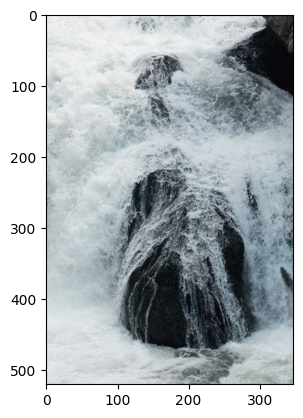

In [186]:
image = Image.open(path2 + "/shutter-speed-high.jpg") #example image
plt.imshow(image)
img_resized = image.resize((312,208))
img_arr_reshaped = np.array(img_resized)
gray_image = cv2.cvtColor(img_arr_reshaped, cv2.COLOR_BGR2GRAY)
gray_image_normalized = gray_image/255

In [187]:
getDirectionalBlurValue(gray_image_normalized)

2.0333233

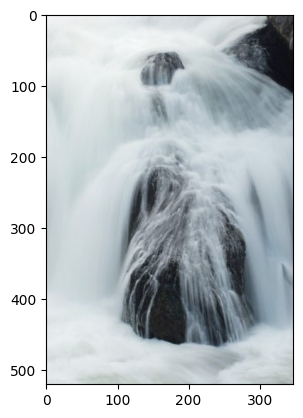

In [188]:
image = Image.open(path2 + "/shutter-speed-low.jpg") #example image
plt.imshow(image)
img_resized = image.resize((312,208))
img_arr_reshaped = np.array(img_resized)
gray_image = cv2.cvtColor(img_arr_reshaped, cv2.COLOR_BGR2GRAY)
gray_image_normalized = gray_image/255

In [189]:
getDirectionalBlurValue(gray_image_normalized) #lower value means more directional blur 

0.105270386

#### Aperture

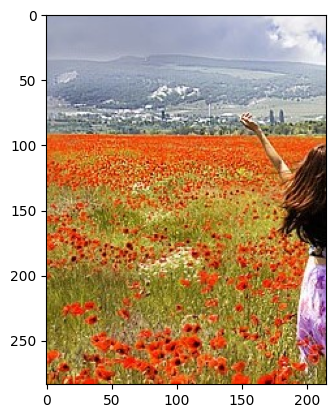

In [190]:
image = Image.open(path2 + "/aperture-high.jpg") #example image
plt.imshow(image)
img_resized = image.resize((312,208))
img_arr_reshaped = np.array(img_resized)
gray_image = cv2.cvtColor(img_arr_reshaped, cv2.COLOR_BGR2GRAY)
gray_image_normalized = gray_image/255

In [191]:
getLaplacianValue(gray_image_normalized)

0.047145248121729884

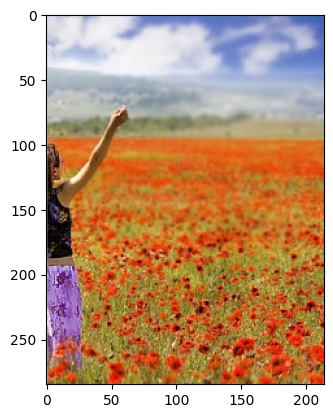

In [192]:
image = Image.open(path2 + "/aperture-low.jpg") #example image
plt.imshow(image)
img_resized = image.resize((312,208))
img_arr_reshaped = np.array(img_resized)
gray_image = cv2.cvtColor(img_arr_reshaped, cv2.COLOR_BGR2GRAY)
gray_image_normalized = gray_image/255

In [193]:
getLaplacianValue(gray_image_normalized) #lower value means more backround blur

0.01555060094139504

#### ISO

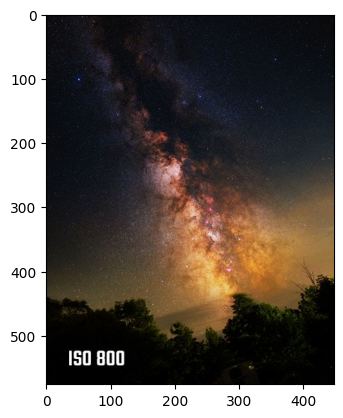

In [194]:
image = Image.open(path2 + "/iso-brightness-low.jpg") #example image
plt.imshow(image)
img_resized = image.resize((312,208))
img_arr_reshaped = np.array(img_resized)
gray_image = cv2.cvtColor(img_arr_reshaped, cv2.COLOR_BGR2GRAY)
gray_image_normalized = gray_image/255

In [195]:
getImageMean(gray_image_normalized)

0.1624580626136056

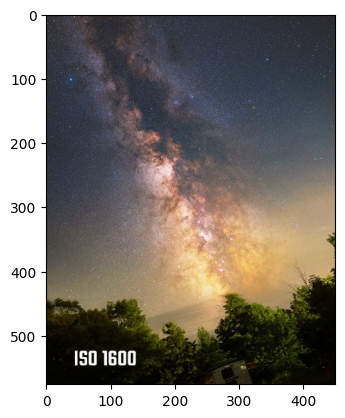

In [196]:
image = Image.open(path2 + "/iso-brightness-high.jpg") #example image
plt.imshow(image)
img_resized = image.resize((312,208))
img_arr_reshaped = np.array(img_resized)
gray_image = cv2.cvtColor(img_arr_reshaped, cv2.COLOR_BGR2GRAY)
gray_image_normalized = gray_image/255

In [197]:
getImageMean(gray_image_normalized) #higher value means brighter image overall

0.3276844761573268

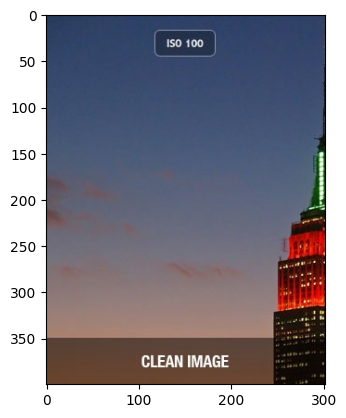

In [198]:
image = Image.open(path2 + "/iso-noise-low.jpg") #example image
plt.imshow(image)
img_resized = image.resize((312,208))
img_arr_reshaped = np.array(img_resized)
gray_image = cv2.cvtColor(img_arr_reshaped, cv2.COLOR_BGR2GRAY)
gray_image_normalized = gray_image/255

In [199]:
getNoiseLevel(gray_image_normalized)

0.1060518659878496

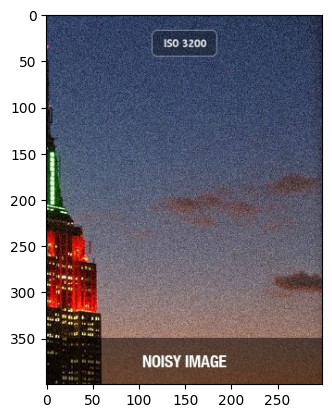

In [200]:
image = Image.open(path2 + "/iso-noise-high.jpg") #example image
plt.imshow(image)
img_resized = image.resize((312,208))
img_arr_reshaped = np.array(img_resized)
gray_image = cv2.cvtColor(img_arr_reshaped, cv2.COLOR_BGR2GRAY)
gray_image_normalized = gray_image/255

In [201]:
getNoiseLevel(gray_image_normalized) #larger value means more noise

0.13387147284000103

#### mnist

In [202]:
mnist = tf.keras.datasets.mnist

(xt, yt), (xte, yte) = mnist.load_data()
print(xt.shape)
print(xt[0].shape)

xt = xt/255
xte = xte/255

(60000, 28, 28)
(28, 28)


In [203]:
model = Sequential()
model.add(LSTM(128, activation="relu", return_sequences='True'))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(LSTM(128, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(32, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(32, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(10, activation="softmax"))

model.compile(loss='sparse_categorical_crossentropy', optimizer="Adam", metrics=['accuracy'])

model.fit(xt, yt, epochs=10, validation_data=(xte, yte)) #we apply the same model with mnist to verify that it is possible to learn with LSTMs and images

Epoch 1/10
1875/1875 [==============================] - 43s 22ms/step - loss: 0.4749 - accuracy: 0.8588 - val_loss: 0.1589 - val_accuracy: 0.9537
Epoch 2/10
1875/1875 [==============================] - 39s 21ms/step - loss: 0.1514 - accuracy: 0.9612 - val_loss: 0.0875 - val_accuracy: 0.9749
Epoch 3/10
1875/1875 [==============================] - 39s 21ms/step - loss: 0.1091 - accuracy: 0.9735 - val_loss: 0.0938 - val_accuracy: 0.9743
Epoch 4/10
1875/1875 [==============================] - 40s 21ms/step - loss: 0.0884 - accuracy: 0.9786 - val_loss: 0.0479 - val_accuracy: 0.9873
Epoch 5/10
1875/1875 [==============================] - 40s 21ms/step - loss: 0.0769 - accuracy: 0.9816 - val_loss: 0.0707 - val_accuracy: 0.9832
Epoch 6/10
1875/1875 [==============================] - 41s 22ms/step - loss: 0.0727 - accuracy: 0.9830 - val_loss: 0.0526 - val_accuracy: 0.9859
Epoch 7/10
1875/1875 [==============================] - 40s 21ms/step - loss: 0.0612 - accuracy: 0.9862 - val_loss: 0.0445 -

#### Permutation Test

In [204]:

from sklearn.metrics import accuracy_score

observed_accuracy = accuracy_score(y_test_c, y_pred_rf)

num_permutations = 1000  
permuted_accuracies = []
for _ in range(num_permutations):
    # Permute labels
    y_permuted = np.random.permutation(y_test_c)
    # Use the best Random Forest model for predictions with permuted labels
    y_pred_permuted = best_rf_comb.predict(X_test_c)

    # Calculate accuracy with permuted labels
    permuted_accuracy = accuracy_score(y_permuted, y_pred_permuted)
    permuted_accuracies.append(permuted_accuracy)
    

# Compare observed accuracy to the null distribution
p_value = (np.sum(permuted_accuracies >= observed_accuracy) + 1) / (num_permutations + 1)

print(f"Observed Accuracy: {observed_accuracy}")
print(f"P-value: {p_value}") #if p-value is greater than selected, we reject the null hypothesis that our original accuracy can come from random chance alone


Observed Accuracy: 0.2916666666666667
P-value: 0.000999000999000999
